In [2]:
import numpy as np
import pandas as pd

import os, sys
import matplotlib.pyplot as plt

from tqdm.notebook import tqdm

# DESEQ2 Package for Python
from pydeseq2.dds import DeseqDataSet
from pydeseq2.default_inference import DefaultInference
from pydeseq2.ds import DeseqStats
from pydeseq2.utils import load_example_data

import scipy.stats as stats
import pickle
import math


import seaborn as sns
import statsmodels.api as sm
from statsmodels.formula.api import glm

# Utils

In [3]:
def gen_coding(x):
    if x == 'A':
        return 'T'
    elif x == "T":
        return 'A'
    elif x == 'C':
        return 'G'
    else:
        return 'C'
        
def gen_reverse_coding(x):
    y = list(x)
    y.reverse()
    y = [gen_coding(i) for i in y]
    return "".join(y)

### Unit test
gen_reverse_coding("ACTGG") == 'CCAGT'

def agg_comp_gene(df):
    agg_data = {}
    for col in df.columns[1:,]:
        col_pair = gen_reverse_coding(col)
        if (col not in agg_data) and (col_pair not in agg_data):
            if col == col_pair:
                agg_data[col] = df[col].values
            else:
                agg_data[col] = df[col].values + df[col_pair].values
    return pd.DataFrame(agg_data, index=df['Gene']).reset_index()

In [4]:
BASEPATH = "data"

files = os.listdir(BASEPATH)

In [5]:
df_sample = pd.read_csv(os.path.join(BASEPATH, "Gat201_samplesheet.csv"))
df_counts = pd.read_csv(os.path.join(BASEPATH, "counts_all.csv"))


df_k = {}
for k in [2,3,4,5]:
    if k == 5:
        df_k[k] = pd.read_csv(os.path.join(BASEPATH, f"H99_all_genes_promoter_500nt_{k}mer_counts.csv"))
    else:
        df_k[k] = pd.read_csv(os.path.join(BASEPATH, f"H99_all_genes_promoter_500nt_{k}mer_counts.csv"), skiprows=10)
    df_k[k] = agg_comp_gene(df_k[k])


# Get Full
df_k_full = df_k[2]

for k in [3,4,5]:
    df_k_full = pd.merge(df_k_full, df_k[k], on='Gene')

In [436]:
def get_encoded_df(df_counts, df_sample):
    # Get temporary dataset
    dval = df_counts[df_sample['Title'].values]
    
    # Reshape the data to be long
    df_main = pd.DataFrame(data={
        'geneid':np.concatenate([df_counts['Geneid'].values]*dval.shape[1]),
        'chr': np.concatenate([df_counts['Chr'].values]*dval.shape[1]),
        'start': np.concatenate([df_counts['Start'].values]*dval.shape[1]),
        'end': np.concatenate([df_counts['End'].values]*dval.shape[1]),
        'strand_pos': (np.concatenate([df_counts['Strand'].values]*dval.shape[1])=="+")*1,
        'title': np.repeat(df_sample['Title'].values, dval.shape[0]),
        'count': np.concatenate(dval.T.values)
        
    })
    
    # Get the factors from title
    df_main['strain'] = df_main['title'].apply(lambda x: x.split('_')[0])
    df_main['media'] = df_main['title'].apply(lambda x: x.split('_')[1])
    df_main['time'] = df_main['title'].apply(lambda x: x.split('_')[2])
    # df_main['replica'] = df_main['title'].apply(lambda x: x.split('_')[3])
    
    df_main['genotype'] = df_main['strain'].apply(lambda x: 'WT' if x in ['A', 'a'] else 'del')
    
    # One hot encoding
    # df_main_encoded = pd.get_dummies(df_main, columns=["strain", "media", "time", "replica", "genotype"], drop_first=True)
    df_main_encoded = pd.get_dummies(df_main, columns=["time", "genotype", "media"], drop_first=False)
    
    # Get the Median for normalization
    df_median = df_main_encoded[['title', 'count']].groupby('title').median().reset_index()
    df_median['count'] = np.log(df_median['count'])
    df_median = df_median.rename(columns={
        'count': 'count_log_median'
    })

    df_main_encoded_med = pd.merge(df_main_encoded, df_median, on='title')

    return df_main_encoded_med

In [8]:
cols_sample = df_counts.columns.difference(['Chr', 'Start', 'End', 'Strand', 'Length'], sort=False)
df_counts_fin = df_counts[cols_sample].set_index("Geneid").T

df_count_meta = pd.DataFrame([i.split("_") for i in df_counts_fin.index], 
                             columns=['strain', 'media', 'time', 'rep'],
                            index=df_counts_fin.index)
df_count_meta['genotype'] = df_count_meta['strain'].apply(lambda x: 'WT' if x in ['A', 'a'] else 'del')

df_count_meta['time'] = df_count_meta['time'].astype(int)

In [1102]:
def plot_residuals_vs_fitted(y_true, y_pred):
    residuals = y_true - y_pred
    plt.figure(figsize=(8, 6))
    plt.scatter(y_pred, residuals, alpha=0.5)
    plt.axhline(0, color='red', linestyle='--')
    plt.xlabel('Fitted values')
    plt.ylabel('Residuals')
    # plt.title('Residuals vs. Fitted Values')
    # plt.show()


def qq_plot(data, lb_data=None, ub_data=None, distribution='norm', params=None, title='QQ Plot', xlabel='Theoretical Counts', ylabel='Sample Counts'):
    """
    Create a QQ plot to compare the quantiles of the data against the quantiles of a specified distribution.
    
    Parameters:
    - data: array-like, the sample data to be compared.
    - distribution: string, the name of the distribution to compare against ('norm' for normal distribution, 'nbinom' for negative binomial).
    - params: tuple, parameters for the distribution (e.g., (n, p) for negative binomial).
    - title: string, the title of the plot.
    - xlabel: string, label for the x-axis.
    - ylabel: string, label for the y-axis.
    """
    # Ensure the data is in a numpy array
    data = np.asarray(data)
    if lb_data is not None:
        lb_data = np.asarray(lb_data)
        ub_data = np.asarray(ub_data)
    
    # Get the quantiles of the sample data
    sample_quantiles = np.sort(data)
    if lb_data is not None:
        sample_quantiles_lb = np.sort(lb_data)
        sample_quantiles_ub = np.sort(ub_data)
    
    # Generate theoretical quantiles from the specified distribution
    if distribution == 'norm':
        # Normal distribution
        theoretical_quantiles = stats.norm.ppf((np.arange(len(data)) + 1) / (len(data) + 1))
    elif distribution == 'nbinom':
        if params is None or len(params) != 2:
            raise ValueError("Parameters for negative binomial distribution must be a tuple (n, p).")
        n, p = params
        # Negative binomial distribution
        # Generate quantiles for negative binomial
        theoretical_quantiles = stats.nbinom.ppf((np.arange(len(data)) + 1) / (len(data) + 1), n, p)
    else:
        raise ValueError("Unsupported distribution. Please use 'norm' for normal distribution or 'nbinom' for negative binomial distribution.")
    
    # Create QQ plot
    plt.figure(figsize=(4, 3))
    
    if lb_data is not None:
        plt.plot(theoretical_quantiles, sample_quantiles_lb, color='green', label='95%')
        plt.plot(theoretical_quantiles, sample_quantiles_ub, color='green')

    plt.scatter(theoretical_quantiles, sample_quantiles, edgecolor='k', color='blue')
    plt.plot(theoretical_quantiles, theoretical_quantiles, 'r--')
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(False)
    plt.legend()
    # plt.show()


# Deseq2 Modelling

In [9]:
inference = DefaultInference(n_cpus=4)

In [819]:
def deseq_pipeline(dds):
    dds.fit_size_factors()
    dds.fit_genewise_dispersions()
    dds.fit_dispersion_trend()
    dds.fit_dispersion_prior()
    dds.fit_MAP_dispersions()
    dds.fit_LFC()
    dds.calculate_cooks()
    # dds.refit()
    
    return dds

## Factor Analysis

In [11]:
dds = {}
stat_res = {}

for motif in ['strain', 'media', 'time', 'genotype']:
    dds[motif] = DeseqDataSet(
                        counts=df_counts_fin,
                        metadata=df_count_meta,
                        design_factors=[motif],
                        refit_cooks=True,
                        inference=inference
                    )
    dds[motif] = deseq_pipeline(dds[motif])
    stat_res[motif] = DeseqStats(dds[motif], alpha=0.05, cooks_filter=False, independent_filter=True)
    stat_res[motif].run_wald_test()
    stat_res[motif].summary()

Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 0.85 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...
... done in 1.12 seconds.

Fitting LFCs...
... done in 0.42 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 136 outlier genes.

Fitting dispersions...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting LFCs...
... done in 0.02 seconds.

Running Wald tests...
... done in 0.80 seconds.



Log2 fold change & Wald test p-value: strain B vs A
               baseMean  log2FoldChange     lfcSE       stat        pvalue  \
Geneid                                                                       
CNAG_00002   851.594791        0.197394  0.461759   0.427481  6.690288e-01   
CNAG_00003   135.320489       -0.064881  0.276124  -0.234970  8.142324e-01   
CNAG_00004   230.614241       -0.230954  0.229884  -1.004657  3.150620e-01   
CNAG_00005   514.954590        0.390139  0.214079   1.822406  6.839339e-02   
CNAG_00006  1072.938209        0.168920  0.162917   1.036844  2.998088e-01   
...                 ...             ...       ...        ...           ...   
CNAG_08027   163.360447       -0.102982  0.237052  -0.434428  6.639778e-01   
CNAG_08028    91.355024       -0.116871  0.298146  -0.391992  6.950644e-01   
CNAG_08029    56.469901       -0.005688  0.238648  -0.023834  9.809851e-01   
CNAG_14001   383.967072        8.175944  0.459937  17.776236  1.079910e-70   
CNAG_14002  

Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 0.78 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...
... done in 1.12 seconds.

Fitting LFCs...
... done in 0.42 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 2 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...
... done in 0.86 seconds.



Log2 fold change & Wald test p-value: media RS vs R
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Geneid                                                                  
CNAG_00002   851.594791        0.036874  0.342693  0.107600  0.914313   
CNAG_00003   135.320489        0.130790  0.105625  1.238247  0.215624   
CNAG_00004   230.614241        0.133479  0.162497  0.821422  0.411406   
CNAG_00005   514.954590        0.455080  0.165276  2.753456  0.005897   
CNAG_00006  1072.938209        0.123787  0.120659  1.025927  0.304926   
...                 ...             ...       ...       ...       ...   
CNAG_08027   163.360447       -0.012480  0.149815 -0.083306  0.933609   
CNAG_08028    91.355024       -0.022336  0.115252 -0.193797  0.846334   
CNAG_08029    56.469901       -0.318463  0.148151 -2.149576  0.031589   
CNAG_14001   383.967072        0.113714  0.618807  0.183764  0.854199   
CNAG_14002    48.311822        0.201353  0.233055  0.863971  0.387604   

Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 0.72 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...
... done in 1.01 seconds.

Fitting LFCs...
... done in 0.45 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 2 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.01 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...
... done in 0.76 seconds.



Log2 fold change & Wald test p-value: time 120 vs 0
               baseMean  log2FoldChange     lfcSE       stat        pvalue  \
Geneid                                                                       
CNAG_00002   851.594791       -0.343453  0.107861  -3.184208  1.451509e-03   
CNAG_00003   135.320489       -1.532730  0.115422 -13.279331  3.051084e-40   
CNAG_00004   230.614241       -0.836667  0.083237 -10.051667  9.032595e-24   
CNAG_00005   514.954590        0.354343  0.176330   2.009548  4.447909e-02   
CNAG_00006  1072.938209       -0.260414  0.078930  -3.299281  9.693300e-04   
...                 ...             ...       ...        ...           ...   
CNAG_08027   163.360447        1.321162  0.109461  12.069759  1.525810e-33   
CNAG_08028    91.355024       -1.576035  0.123279 -12.784308  2.006413e-37   
CNAG_08029    56.469901        1.279475  0.166124   7.701932  1.340245e-14   
CNAG_14001   383.967072        0.484323  0.901500   0.537242  5.911006e-01   
CNAG_14002  

Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 0.82 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...
... done in 1.06 seconds.

Fitting LFCs...
... done in 0.46 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...


Log2 fold change & Wald test p-value: genotype del vs WT
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Geneid                                                                  
CNAG_00002   851.594791        0.105138  0.322055  0.326458  0.744078   
CNAG_00003   135.320489       -0.060836  0.192107 -0.316680  0.751487   
CNAG_00004   230.614241       -0.134798  0.160139 -0.841755  0.399925   
CNAG_00005   514.954590        0.494264  0.149477  3.306630  0.000944   
CNAG_00006  1072.938209        0.190725  0.113088  1.686525  0.091695   
...                 ...             ...       ...       ...       ...   
CNAG_08027   163.360447       -0.124405  0.164648 -0.755582  0.449900   
CNAG_08028    91.355024       -0.069659  0.207637 -0.335484  0.737260   
CNAG_08029    56.469901       -0.070070  0.166474 -0.420907  0.673823   
CNAG_14001   383.967072        1.017023  0.562593  1.807740  0.070647   
CNAG_14002    48.311822       -0.247381  0.230131 -1.074955  0.2823

... done in 0.78 seconds.



In [12]:
df_pval_res = pd.DataFrame()
for motif in ['strain', 'media', 'time', 'genotype']:
    if len(df_pval_res) == 0:
        df_pval_res = stat_res[motif].results_df[['pvalue']]
    else:
        df_pval_res = pd.merge(df_pval_res, stat_res[motif].results_df[['pvalue']], on='Geneid')
    
    df_pval_res = df_pval_res.rename(columns={
        'pvalue': motif
    })

Text(0, 0.5, 'P-Value')

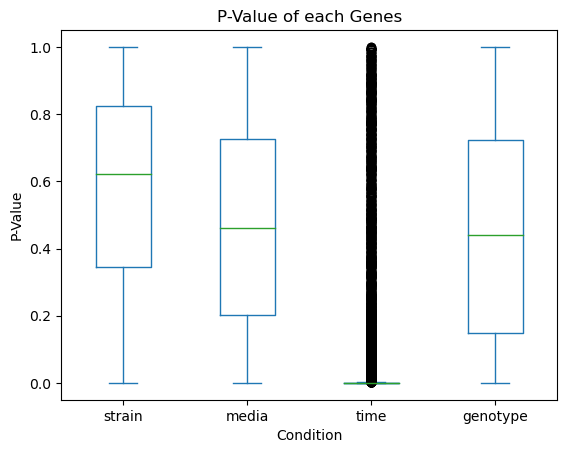

In [13]:
df_pval_res.plot.box()

plt.title('P-Value of each Genes')

plt.xlabel('Condition')
plt.ylabel('P-Value')


### Findings:
1. Given Strain, most of geneid, unable to significantly differentiate the count based on strain.
2. Given Time, most of geneid, they can tell the difference of the count, based on time.

## Analysis: Factor x Time

In [821]:
REMOVE_OUTLIER = False

for motif in ['media', 'genotype']:
    interaction_name = f'{motif}:time'
    df_count_meta[interaction_name] = df_count_meta.apply(lambda x: x[motif] + '_' + str(x['time']), axis=1)

    dds[interaction_name] = DeseqDataSet(
                        counts=df_counts_fin,
                        metadata=df_count_meta,
                        design_factors=[interaction_name],
                        refit_cooks=REMOVE_OUTLIER,
                        inference=inference
                    )
    dds[interaction_name] = deseq_pipeline(dds[interaction_name])
    if REMOVE_OUTLIER:
        dds[interaction_name].refit()
    stat_res[interaction_name] = DeseqStats(dds[interaction_name], alpha=0.05, cooks_filter=False, independent_filter=True)
    stat_res[interaction_name].run_wald_test()
    stat_res[interaction_name].summary()

/Users/alim/miniconda3/envs/main/lib/python3.11/site-packages/pydeseq2/dds.py:264: UserWarning:

Some factor levels in the design contain underscores ('_').
                    They will be converted to hyphens ('-').

Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 0.75 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...
... done in 1.33 seconds.

Fitting LFCs...
... done in 0.52 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Running Wald tests...
... done in 0.27 seconds.



Log2 fold change & Wald test p-value: media:time R-240 vs R-120
               baseMean  log2FoldChange     lfcSE      stat        pvalue  \
Geneid                                                                      
CNAG_00002   851.594791       -0.577546  0.126253 -4.574530  4.772905e-06   
CNAG_00003   135.320489       -0.231294  0.133727 -1.729597  8.370222e-02   
CNAG_00004   230.614241       -0.507780  0.096699 -5.251166  1.511395e-07   
CNAG_00005   514.954590       -0.809159  0.175371 -4.613997  3.949976e-06   
CNAG_00006  1072.938209        0.396901  0.086663  4.579834  4.653459e-06   
...                 ...             ...       ...       ...           ...   
CNAG_08027   163.360447        0.002161  0.109128  0.019799  9.842037e-01   
CNAG_08028    91.355024        0.142285  0.143264  0.993167  3.206285e-01   
CNAG_08029    56.469901       -0.106617  0.140386 -0.759458  4.475787e-01   
CNAG_14001   383.967072       -0.452594  1.064375 -0.425220  6.706760e-01   
CNAG_14002  

/Users/alim/miniconda3/envs/main/lib/python3.11/site-packages/pydeseq2/dds.py:264: UserWarning:

Some factor levels in the design contain underscores ('_').
                    They will be converted to hyphens ('-').

Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 0.77 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...
... done in 1.06 seconds.

Fitting LFCs...
... done in 0.42 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: genotype:time WT-120 vs WT-0
               baseMean  log2FoldChange     lfcSE       stat        pvalue  \
Geneid                                                                       
CNAG_00002   851.594791        0.074415  0.119235   0.624100  5.325617e-01   
CNAG_00003   135.320489       -1.580496  0.147479 -10.716722  8.496105e-27   
CNAG_00004   230.614241       -0.909229  0.115299  -7.885854  3.123916e-15   
CNAG_00005   514.954590       -0.087522  0.191121  -0.457941  6.469947e-01   
CNAG_00006  1072.938209       -0.298654  0.093379  -3.198314  1.382337e-03   
...                 ...             ...       ...        ...           ...   
CNAG_08027   163.360447        1.294968  0.155107   8.348865  6.892188e-17   
CNAG_08028    91.355024       -1.361204  0.148656  -9.156710  5.350346e-20   
CNAG_08029    56.469901        1.191274  0.239817   4.967440  6.784266e-07   
CNAG_14001   383.967072        0.553426  1.281664   0.431803  6.658848e-01 

... done in 0.89 seconds.



In [823]:
df_pval_res = pd.DataFrame()
for motif in ['strain', 'media', 'time', 'genotype', 'media:time', 'genotype:time']:
    if len(df_pval_res) == 0:
        df_pval_res = stat_res[motif].results_df[['pvalue']]
    else:
        df_pval_res = pd.merge(df_pval_res, stat_res[motif].results_df[['pvalue']], on='Geneid')
    
    df_pval_res = df_pval_res.rename(columns={
        'pvalue': motif
    })

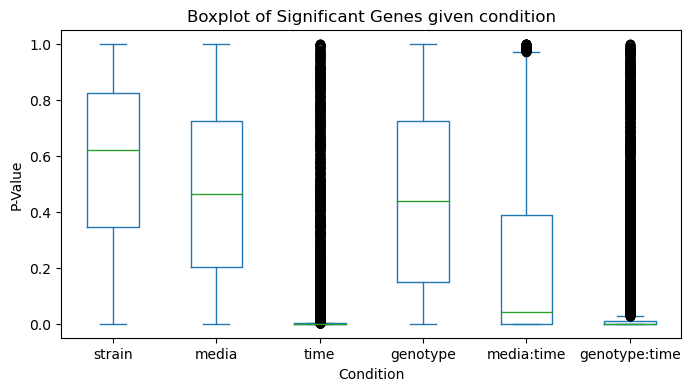

In [824]:
df_pval_res.plot.box(figsize=(8, 4))


plt.title('Boxplot of Significant Genes given condition')

plt.xlabel('Condition')
plt.ylabel('P-Value')

plt.show()


# Analysis: Time Changes

In [18]:
exp_list = []

times = [0, 30, 120, 240]
for idx in range(1,len(times)):
    t1 = times[idx]
    t2 = times[0]
    motif_code = f'time_{t1}_{t2}'
    exp_list.append(motif_code)

for idx in range(len(times)):
    if idx > 0:
        t1 = times[idx]
        t2 = times[idx-1]
        motif_code = f'time_{t1}_{t2}'
        exp_list.append(motif_code)



In [20]:
def run_exp_time_by_time_pipeline(dds, stat_res, df_count, df_meta, exp_list):
    for el in exp_list:
        idx_true = df_meta['time'].apply(lambda x: str(x) in el.split('_'))    
        motif_code = el
        print(df_meta.dtypes)
        dds[motif_code] = DeseqDataSet(
                            counts=df_count[idx_true],
                            metadata=df_meta[idx_true],
                            design_factors='time',
                            refit_cooks=True,
                            inference=inference
                        )
        # Revert the order of Time
        col_motif = dds[motif_code].obsm["design_matrix"].columns[1]
        col_motif_split = col_motif.split('_')
        
        t1 = int(col_motif_split[1])
        t2 = int(col_motif_split[3])
        if t1 < t2:
            col_motif_new = f"{col_motif_split[0]}_{t2}_vs_{t1}"        
            dds[motif_code].obsm["design_matrix"][col_motif_new] = (dds[motif_code].obsm["design_matrix"][col_motif]-1)*-1
            dds[motif_code].obsm["design_matrix"].drop(col_motif, axis=1, inplace=True)
            col_motif = col_motif_new
        
        # Start Pipeline
        dds[motif_code] = deseq_pipeline(dds[motif_code])
        dds[motif_code].calculate_cooks()
        dds[motif_code].refit()
        
        stat_res[motif_code] = DeseqStats(dds[motif_code], alpha=0.05, cooks_filter=False, independent_filter=True)
        stat_res[motif_code].run_wald_test()
    
    
        
        stat_res[motif_code].summary()
    return dds, stat_res

dds, stat_res = run_exp_time_by_time_pipeline(dds, stat_res, df_counts_fin, df_count_meta, exp_list)

In [22]:
df_pval_time_changes = pd.DataFrame()
for motif in ['strain', 'media', 'time', 'genotype', 'media:time', 'genotype:time']:
    if len(df_pval_res) == 0:
        df_pval_res = stat_res[motif].results_df[['pvalue']]
    else:
        df_pval_res = pd.merge(df_pval_res, stat_res[motif].results_df[['pvalue']], on='Geneid')
    
    df_pval_res = df_pval_res.rename(columns={
        'pvalue': motif
    })

# Analysis: Time Subset

In [416]:
def run_exp_time_pipeline(dds, stat_res, df_count, df_meta, motif, times):
    for time in times:
        idx_true = df_meta['time']==int(time)
        

        if type(motif) != list:
            motif_code = f'{motif}|time_{time}'
            motif = [motif]
        else:
            motif_code = "|".join(motif) + f"|time_{time}"
            
        dds[motif_code] = DeseqDataSet(
                            counts=df_count[idx_true],
                            metadata=df_meta[idx_true],
                            design_factors=motif,
                            refit_cooks=True,
                            inference=inference
                        )
        
        list_revert = ['genotype_del_vs_WT']
        
        for lr in list_revert:
            if lr in dds[motif_code].obsm['design_matrix']:
                lr_s = lr.split('_')
                lr_change = "_".join([lr_s[0], lr_s[3], lr_s[2], lr_s[1]])
        
                dds[motif_code].obsm['design_matrix'][lr] -=1
                dds[motif_code].obsm['design_matrix'][lr] *=-1
        
                dds[motif_code].obsm['design_matrix'].rename(columns={
                        lr: lr_change
                    }, inplace=True)
        
        
        dds[motif_code] = deseq_pipeline(dds[motif_code])
        dds[motif_code].calculate_cooks()
        dds[motif_code].refit()
        
        stat_res[motif_code] = DeseqStats(dds[motif_code], alpha=0.05, cooks_filter=False, independent_filter=True)
        stat_res[motif_code].run_wald_test()
    
    
        
        stat_res[motif_code].summary()
    return dds, stat_res


def get_df_pval(stat_res, motif, times):
    df_pval_res_time = pd.DataFrame()
    for time in times:    
        if type(motif) != list:
            motif_code = f'{motif}|time_{time}'
            motif = [motif]
        else:
            motif_code = "|".join(motif) + f"|time_{time}"
            
        if len(df_pval_res_time) == 0:
            df_pval_res_time = stat_res[motif_code].results_df[['pvalue']]
        else:
            df_pval_res_time = pd.merge(df_pval_res_time, stat_res[motif_code].results_df[['pvalue']], on='Geneid')
        
        df_pval_res_time = df_pval_res_time.rename(columns={
            'pvalue': motif_code
        })
    return df_pval_res_time


In [431]:
dds, stat_res = run_exp_time_pipeline(dds, stat_res, df_counts_fin, df_count_meta, 'media', ['30', '120', '240'])
dds, stat_res = run_exp_time_pipeline(dds, stat_res, df_counts_fin, df_count_meta, 'genotype', ['0','30', '120', '240'])
dds, stat_res = run_exp_time_pipeline(dds, stat_res, df_counts_fin, df_count_meta, ['media', 'genotype'], ['30', '120', '240'])

In [420]:
df_pval_res_media = get_df_pval(stat_res, motif='media', times=['30', '120', '240'])
df_pval_res_gen = get_df_pval(stat_res, motif='genotype', times=['0', '30', '120', '240'])
df_pval_res_gm = get_df_pval(stat_res, motif=['media', 'genotype'], times=['30', '120', '240'])

In [ ]:
def run_exp_mf_time_pipeline(dds, stat_res, df_count, df_meta, motif, times):
    for time in times:
        idx_true = df_meta['time']==int(time)
        
        motif_code = f'{motif}|time_{time}'
        dds[motif_code] = DeseqDataSet(
                            counts=df_count[idx_true],
                            metadata=df_meta[idx_true],
                            design_factors=[motif],
                            refit_cooks=True,
                            inference=inference
                        )
        
        # Revert the order of Genotype
        if motif == 'genotype':
            col_motif = dds[motif_code].obsm["design_matrix"].columns[1]
            col_motif_split = col_motif.split('_')
            
            t1 = col_motif_split[1]
            t2 = col_motif_split[3]
            
            col_motif_new = f"{col_motif_split[0]}_{t2}_vs_{t1}"
                
            dds[motif_code].obsm["design_matrix"][col_motif_new] = (dds[motif_code].obsm["design_matrix"][col_motif]-1)*-1
            dds[motif_code].obsm["design_matrix"].drop(col_motif, axis=1, inplace=True)
            dds[motif_code].obsm["design_matrix"]
        
        
        dds[motif_code] = deseq_pipeline(dds[motif_code])
        dds[motif_code].calculate_cooks()
        dds[motif_code].refit()
        
        stat_res[motif_code] = DeseqStats(dds[motif_code], alpha=0.05, cooks_filter=False, independent_filter=True)
        stat_res[motif_code].run_wald_test()
    
    
        
        stat_res[motif_code].summary()
    return dds, stat_res

# Analysis: Pval

In [27]:
np.sum(df_pval_res_media<0.05)/len(df_pval_res_media)*100

media|time_30     18.072112
media|time_120    27.888153
media|time_240    28.550405
dtype: float64

In [28]:
np.sum(df_pval_res_gen<0.05)/len(df_pval_res_gen)*100

genotype|time_0      17.748344
genotype|time_30     30.640177
genotype|time_120    29.595291
genotype|time_240    49.551141
dtype: float64

In [423]:
np.sum(df_pval_res_gm<0.05)/len(df_pval_res_gm)*100

media|genotype|time_30     32.553348
media|genotype|time_120    32.965416
media|genotype|time_240    54.010302
dtype: float64

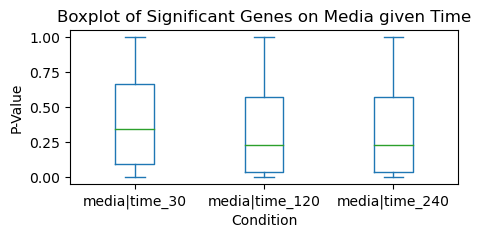

In [424]:
df_pval_res_media.plot.box(figsize=(5, 2))


plt.title('Boxplot of Significant Genes on Media given Time')

plt.xlabel('Condition')
plt.ylabel('P-Value')

plt.show()

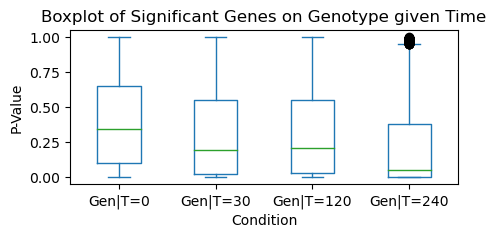

In [425]:
col_rename = {i:"Gen|T="+i.split('_')[-1] for i in df_pval_res_gen.columns}
df_pval_res_gen.rename(columns=col_rename).plot.box(figsize=(5, 2))

plt.title('Boxplot of Significant Genes on Genotype given Time')

plt.xlabel('Condition')
plt.ylabel('P-Value')

plt.show()

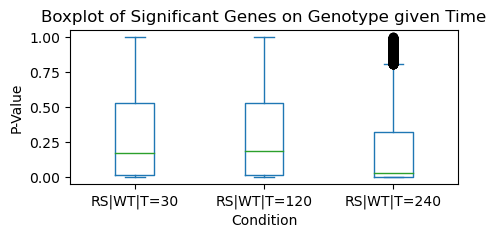

In [428]:
col_rename = {i:"RS|WT|T="+i.split('_')[-1] for i in df_pval_res_gm.columns}
df_pval_res_gm.rename(columns=col_rename).plot.box(figsize=(5, 2))

plt.title('Boxplot of Significant Genes on Genotype given Time')

plt.xlabel('Condition')
plt.ylabel('P-Value')

plt.show()

# Model 1

In [437]:
df_main = get_encoded_df(df_counts, df_sample)

In [563]:
def run_big_model_1(dds, df_main_1, include_media=True):
    big_models_1 = {}    
    for t in [30, 120, 240]:
        if include_media:
            disp_ = np.nanmean(dds[f'media|genotype|time_{t}'].varm['dispersions'])
            big_models_1_fml = "count ~ genotype_WT+media_RS"
        else:
            disp_ = np.nanmean(dds[f'genotype|time_{t}'].varm['dispersions'])
            big_models_1_fml = "count ~ genotype_WT"
            
        df_main_1['genotype_WT'] = df_main_1['genotype_WT'].astype(int)
        df_main_1['media_RS'] = df_main_1['media_RS'].astype(int)
        df_main_1[f'time_{t}'] = df_main_1[f'time_{t}'].astype(int)
        
        big_models_1[t] = fit_glm(df_main_1[df_main_1[f'time_{t}']==1], 
                            big_models_1_fml,  
                            df_main_1[df_main_1[f'time_{t}']==1]['count_log_median'], 
                            alpha=disp_)
    
    t = 0
    disp_ = np.nanmean(dds[f'genotype|time_{t}'].varm['dispersions'])
    
    df_main_1['genotype_WT'] = df_main_1['genotype_WT'].astype(int)
    df_main_1['media_RS'] = df_main_1['media_RS'].astype(int)
    df_main_1[f'time_{t}'] = df_main_1[f'time_{t}'].astype(int)
    
    big_models_1_fml = "count ~ genotype_WT+media_RS"
    big_models_1[t] = fit_glm(df_main_1[df_main_1[f'time_{t}']==1], 
                        big_models_1_fml,  
                        df_main_1[df_main_1[f'time_{t}']==1]['count_log_median'], 
                        alpha=disp_)
    return big_models_1

In [564]:
big_models_1_media = run_big_model_1(dds, df_main, include_media=True)
big_models_1_gen_only = run_big_model_1(dds, df_main, include_media=False)

In [616]:
def glm_summary(model, marker=''):
    pkg = {
        'model': marker,
        'aic': round(model.aic, 0),
        # 'bic': round(model.bic, 2),
        'nll': -round(model.llf, 0),
        'r\^2': model.pseudo_rsquared(),
        'chi^2': round(model.pearson_chi2, 0),
    }
    return pkg

In [626]:
print(pd.DataFrame([glm_summary(big_models_1_media[t], f'gen|media|t={t}') for t in [0, 30, 120, 240]]).to_latex().replace('.000000', '').replace("|", "\|"))

\begin{tabular}{llrrrr}
\toprule
 & model & aic & nll & r\^2 & chi^2 \\
\midrule
0 & gen\|media\|t=0 & 1621738 & 810867 & 0.000617 & 14439834 \\
1 & gen\|media\|t=30 & 3447388 & 1723691 & 0.013028 & 22538691 \\
2 & gen\|media\|t=120 & 3224502 & 1612248 & 0.020246 & 12405147 \\
3 & gen\|media\|t=240 & 3479153 & 1739573 & 0.022180 & 12655422 \\
\bottomrule
\end{tabular}



In [627]:
print(pd.DataFrame([glm_summary(big_models_1_gen_only[t], f'gen|t={t}') for t in [0, 30, 120, 240]]).to_latex().replace('.000000', '').replace("|", "\|"))

\begin{tabular}{llrrrr}
\toprule
 & model & aic & nll & r\^2 & chi^2 \\
\midrule
0 & gen\|t=0 & 1621738 & 810867 & 0.000617 & 14439834 \\
1 & gen\|t=30 & 3126719 & 1563357 & 0.000017 & 19429039 \\
2 & gen\|t=120 & 3005351 & 1502674 & 0.000729 & 11111819 \\
3 & gen\|t=240 & 3191933 & 1595965 & 0.006169 & 11124369 \\
\bottomrule
\end{tabular}



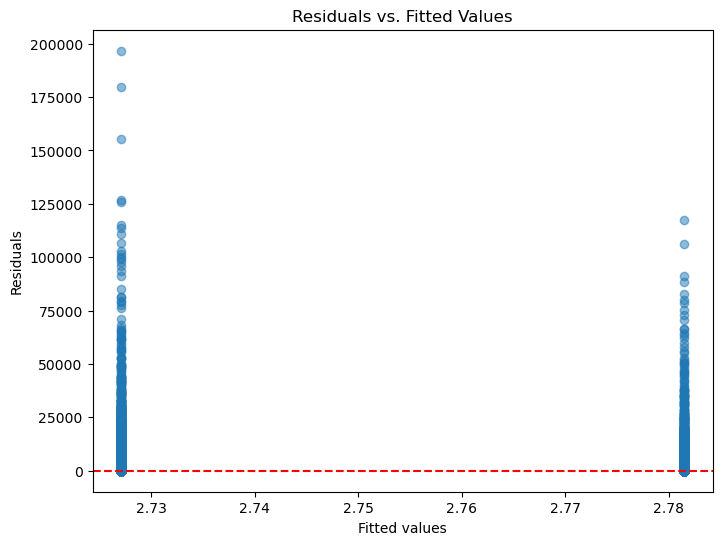

In [623]:
t = 120
y_true = df_main[df_main[f'time_{t}']==1]['count'].values
y_pred = big_models_1_gen_only[t].predict(df_main[df_main[f'time_{t}']==1]).values
plot_residuals_vs_fitted(y_true, y_pred)

# Analysis: Design Matrix

In [31]:
def check_full_rank(x):
    rank = np.linalg.matrix_rank(x)
    res = rank == min(x.shape)
    return res

In [32]:
for key in stat_res:
    is_full_rank = check_full_rank(stat_res[key].design_matrix)
    print(key, is_full_rank)

strain True
media True
time True
genotype True
media:time True
genotype:time True
time_30_0 True
time_120_0 True
time_240_0 True
time_120_30 True
time_240_120 True
media|time_30 True
media|time_120 True
media|time_240 True
genotype|time_0 True
genotype|time_30 True
genotype|time_120 True
genotype|time_240 True


# Analysis: MA

In [674]:
def plot_disp(t=0):
    fig, ax = plt.subplots(figsize=(8,4))
    # fig, ax = plt.subplots(dpi=600)
    
    
    ax.set_adjustable("datalim")
    
    plt.scatter(x=dds['strain'].varm["_normed_means"], y=(dds[f'genotype|time_{t}'].varm['genewise_dispersions']), color='k', alpha=0.5, s=0.6, label='Estimated Disp.')
    plt.scatter(x=dds['strain'].varm["_normed_means"], y=(dds[f'genotype|time_{t}'].varm['dispersions']), color='b', s=0.3, alpha=0.5,label='Final Disp')
    plt.scatter(x=dds['strain'].varm["_normed_means"], y=(dds[f'genotype|time_{t}'].varm['fitted_dispersions']), color='r', alpha=0.5,s=0.6, label='Fitted Disp')
    
    
    
    plt.yscale("log")
    plt.xscale("log")
    
    plt.title(f'Dispersion Parameters across genes at T={t}')
    
    plt.xlabel('Mean of Normalized Counts')
    plt.ylabel('Dispersion')
    
    plt.tight_layout()
    
    plt.legend()
    plt.show()

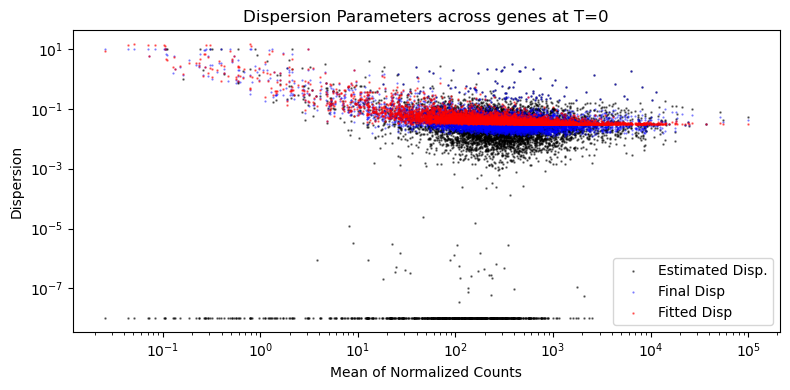

In [675]:
plot_disp(t=0)

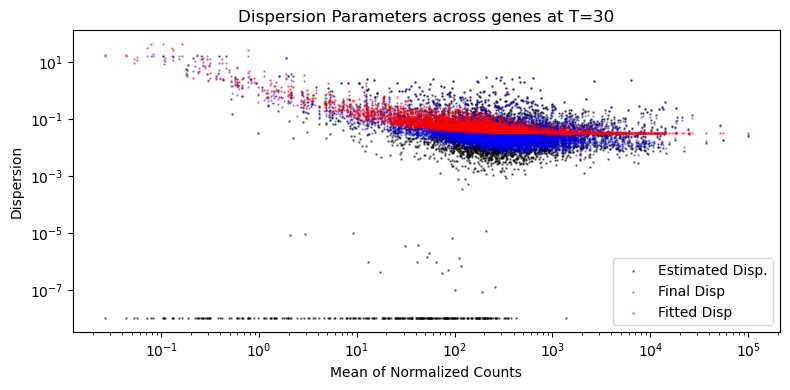

In [676]:
plot_disp(t=30)

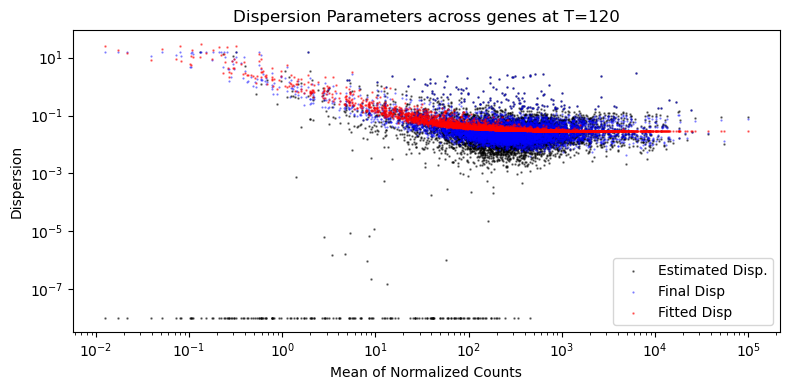

In [677]:
plot_disp(t=120)

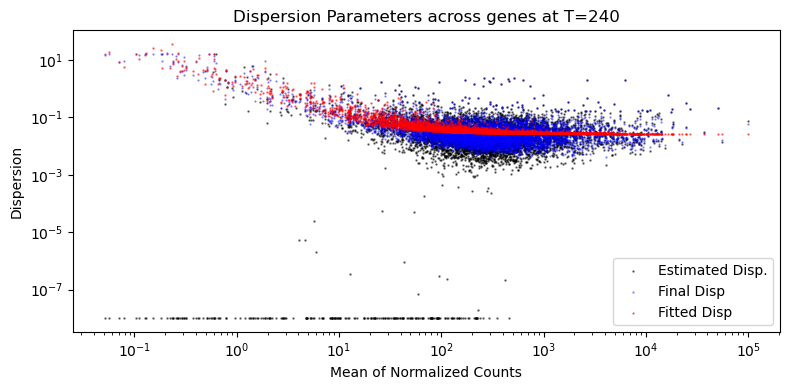

In [678]:
plot_disp(t=240)

## Disp Mean

In [683]:
disp_full = pd.DataFrame([{'time':t, 'mean':np.nanmean(dds[f'genotype|time_{t}'].varm['dispersions']), 'std':np.nanstd(dds[f'genotype|time_{t}'].varm['dispersions'])}  for t in [0, 30, 120, 240]])
disp_full['mean'] = disp_full['mean'].apply(lambda x: round(x, 2))
disp_full['std'] = disp_full['std'].apply(lambda x: round(x, 2))

In [686]:
disp_full['CV'] = disp_full['std']/disp_full['mean'] * 100

In [687]:
print(disp_full.to_latex())

\begin{tabular}{lrrrr}
\toprule
 & time & mean & std & CV \\
\midrule
0 & 0 & 0.110000 & 0.610000 & 554.545455 \\
1 & 30 & 0.150000 & 1.000000 & 666.666667 \\
2 & 120 & 0.130000 & 0.970000 & 746.153846 \\
3 & 240 & 0.120000 & 0.880000 & 733.333333 \\
\bottomrule
\end{tabular}



In [829]:
cooks_dist = {}
cooks_dist_stat = []
for motif in dds:
    if 'genotype|time_' not in motif:
        continue
    dds[motif].calculate_cooks()
    cooks_dist[motif] = pd.DataFrame(dds[motif].layers['cooks'])
    
    cd_ = np.concatenate(cooks_dist[motif].values)
    cd_perc = np.sum(cd_>1)/cd_.shape[0]*100
    cooks_dist_stat.append({
        'motif': motif,
        'perc_influential_data': cd_perc
    })


Calculating cook's distance...
... done in 0.02 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Calculating cook's distance...
... done in 0.01 seconds.



In [830]:
pd.DataFrame(cooks_dist_stat)

,motif,perc_influential_data
0,genotype|time_0,0.710081
1,genotype|time_30,0.287896
2,genotype|time_120,0.160964
3,genotype|time_240,0.058867
4,media|genotype|time_30,0.047829
5,media|genotype|time_120,0.056107
6,media|genotype|time_240,0.031273


In [74]:
pd.DataFrame(cooks_dist_stat)

,motif,perc_influential_data
0,strain,0.560549
1,media,0.014717
2,time,0.017607
3,genotype,0.022338
4,media:time,0.003942
5,genotype:time,0.008410
6,time_30_0,0.141035
7,time_120_0,0.101791
8,time_240_0,0.068065
9,time_120_30,0.120953


In [709]:
from matplotlib.lines import Line2D

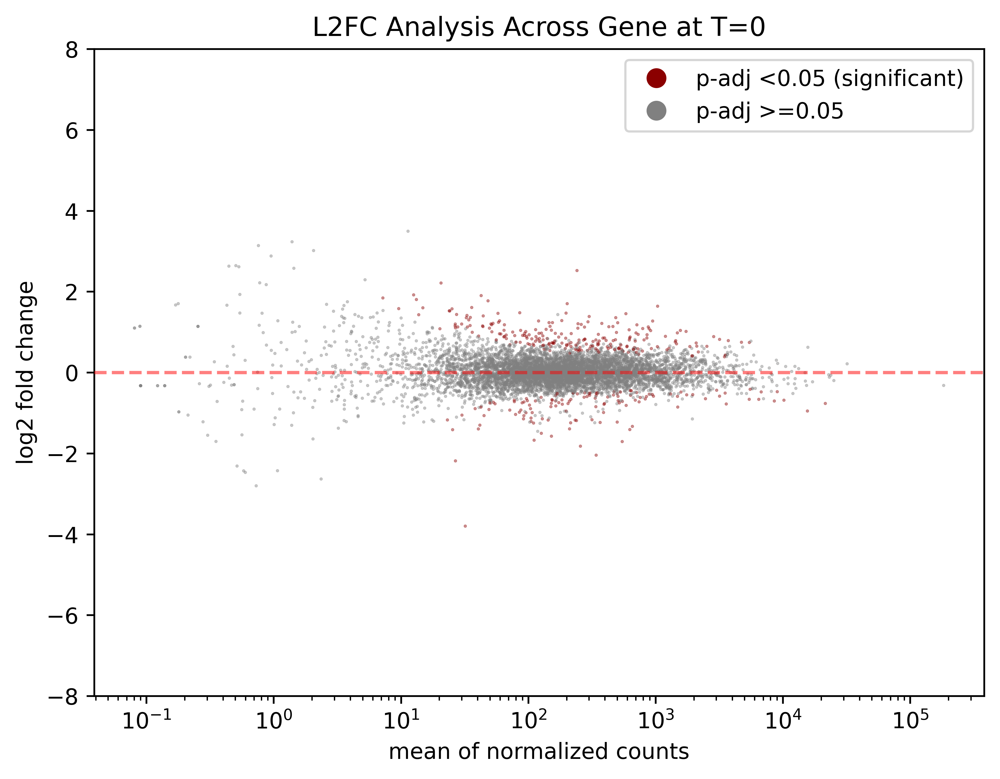

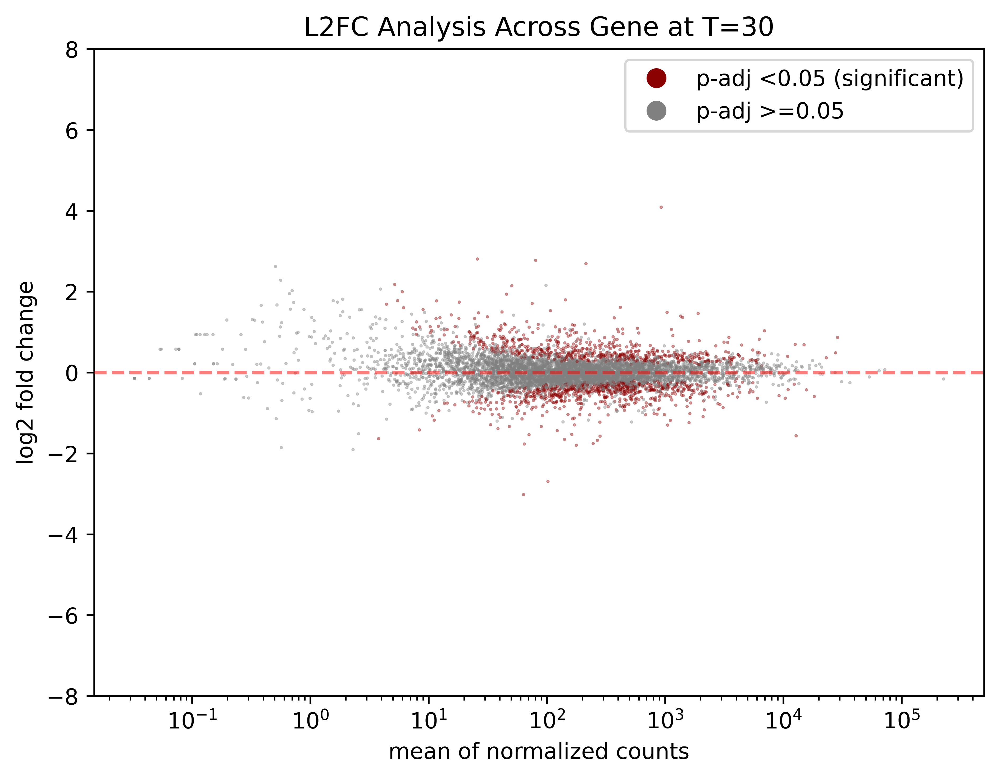

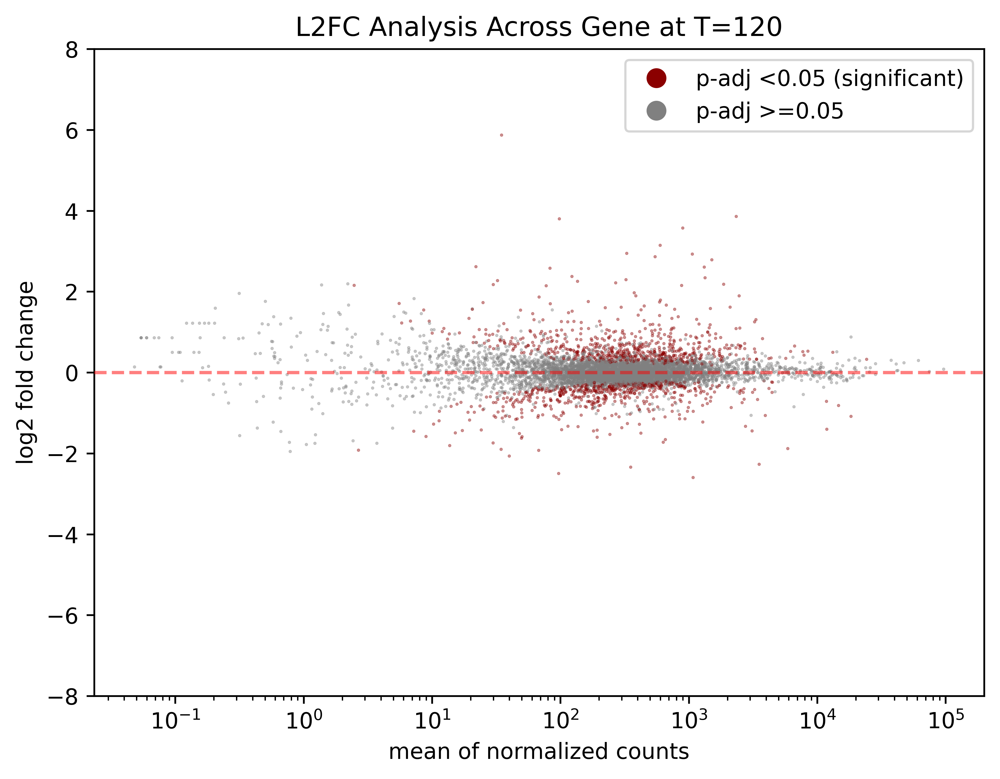

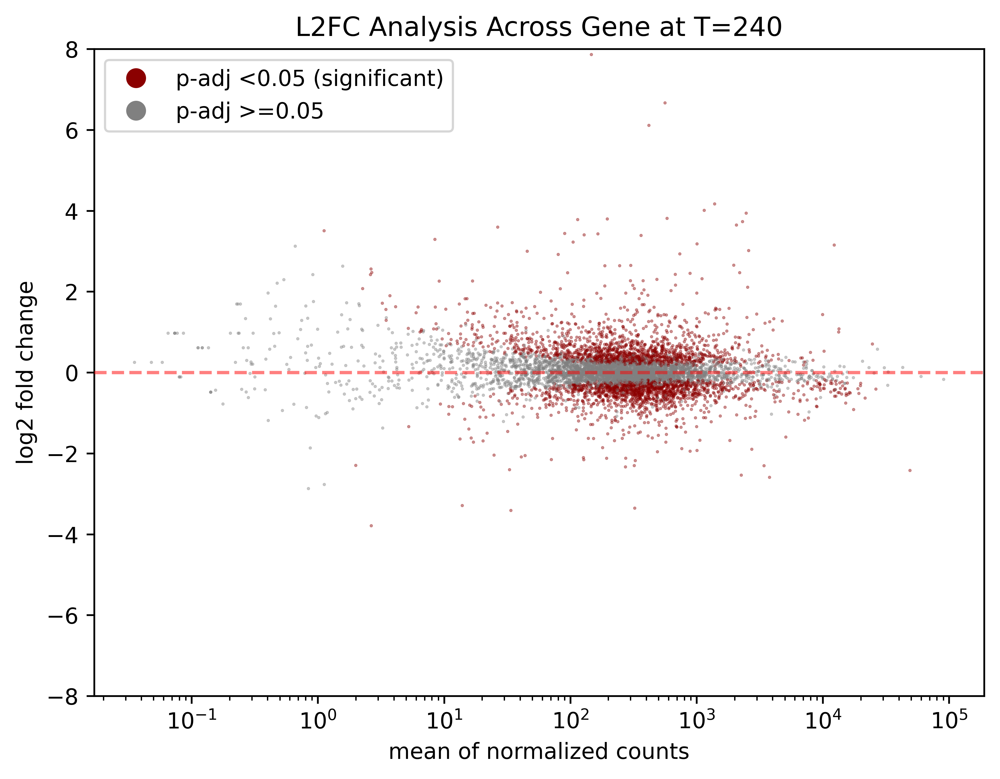

In [1207]:
for t in [0, 30, 120, 240]:
    stat_res[f'genotype|time_{t}'].plot_MA()
    plt.title(f'L2FC Analysis Across Gene at T={t}')
    
    l2fc_legend = {
        'p-adj <0.05 (significant)': 'darkred',
        'p-adj >=0.05': 'gray',
    }
    legend_handles = [Line2D([0], [0], marker='o', color='w', label=label,
                             markerfacecolor=color, markersize=10) 
                      for label, color in l2fc_legend.items()]
        
    # legend_handles = [Patch(color=color, label=label) for label, color in l2fc_legend.items()]

    # Add the legend
    plt.ylim(-8,8)
    plt.legend(handles=legend_handles)
    plt.savefig(f'plot_model_l2fc_t{t}.png', bbox_inches="tight")
    
    plt.show()

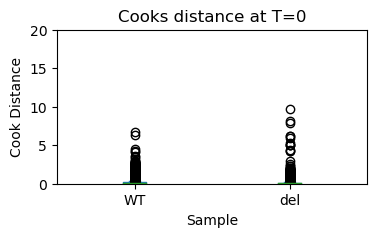

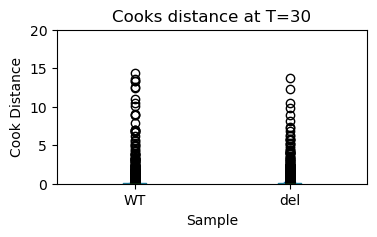

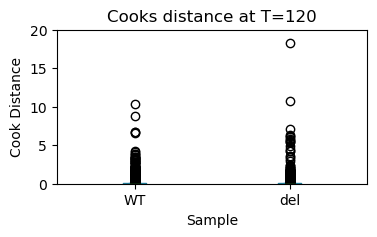

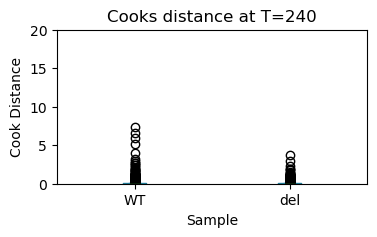

In [831]:
for t in [0, 30, 120, 240]:
    meta_idx = df_count_meta[df_count_meta['time']==t]
    meta_idx_WT = np.where(meta_idx['genotype']=='WT')[0]
    meta_idx_del = np.where(meta_idx['genotype']=='del')[0]    
    
    df_cooks = pd.DataFrame({
        'WT':np.concatenate(cooks_dist[f'genotype|time_{t}'].iloc[meta_idx_WT].values),
        'del':np.concatenate(cooks_dist[f'genotype|time_{t}'].iloc[meta_idx_del].values),
    })
    
    df_cooks.plot.box(figsize=(4, 2))
    
    plt.title(f'Cooks distance at T={t}')
    
    plt.xlabel('Sample')
    plt.ylabel('Cook Distance')
    plt.ylim(0, 20)
    
    # plt.legend()
    plt.savefig(f'plot_model_cooksdistance_t{t}.png', bbox_inches="tight")
    plt.show()

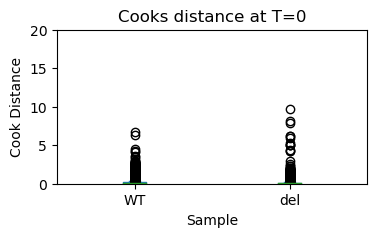

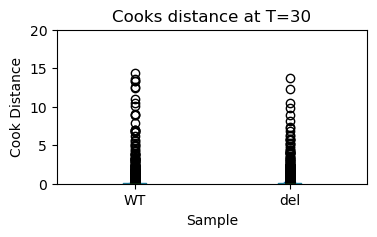

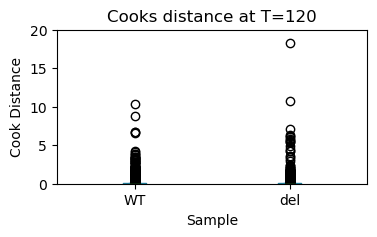

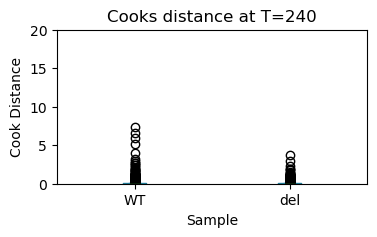

In [818]:
for t in [0, 30, 120, 240]:
    meta_idx = df_count_meta[df_count_meta['time']==t]
    meta_idx_WT = np.where(meta_idx['genotype']=='WT')[0]
    meta_idx_del = np.where(meta_idx['genotype']=='del')[0]    
    
    df_cooks = pd.DataFrame({
        'WT':np.concatenate(cooks_dist[f'genotype|time_{t}'].iloc[meta_idx_WT].values),
        'del':np.concatenate(cooks_dist[f'genotype|time_{t}'].iloc[meta_idx_del].values),
    })
    
    df_cooks.plot.box(figsize=(4, 2))
    
    plt.title(f'Cooks distance at T={t}')
    
    plt.xlabel('Sample')
    plt.ylabel('Cook Distance')
    plt.ylim(0, 20)
    
    # plt.legend()
    plt.savefig(f'plot_model_cooksdistance_t{t}.png', bbox_inches="tight")
    plt.show()

# Analysis: L2FC

In [84]:
def summarize_l2fg(stat_res, alpha=0.05):
    sig_gene = stat_res.results_df[stat_res.padj<0.05]
    
    perc_pos = sum(sig_gene['log2FoldChange']>0)/len(stat_res.results_df)*100
    perc_neg = sum(sig_gene['log2FoldChange']<0)/len(stat_res.results_df)*100

    pos_mean = np.mean(sig_gene[sig_gene['log2FoldChange']>0]['log2FoldChange'])
    neg_mean = np.mean(sig_gene[sig_gene['log2FoldChange']<0]['log2FoldChange'])
    

    pos_mean_change = 2**pos_mean
    neg_mean_change = 2**neg_mean

    sum_l2fc = np.sum(sig_gene['log2FoldChange'])
    mean_l2fc = np.mean(sig_gene['log2FoldChange'])
    std_l2fc = np.std(sig_gene['log2FoldChange'])

    mean_change = 2**mean_l2fc
    mean_change_oposite = 2**(-mean_l2fc)

    title = stat_res.design_matrix.columns[1].replace('_', ' ')

    sig_gene['log2FoldChange'].plot.hist(bins=20)

    print(f"""Perc Positive (L2FC>0): {perc_pos:.2f}% ({pos_mean:.3f} or {pos_mean_change:.2f}x)
Perc Negative (L2FC<0): {perc_neg:.2f}% ({neg_mean:.3f} or {neg_mean_change:.2f}x)
Mean L2FC: {mean_l2fc:.3f}
Std Dev L2FC: {std_l2fc:.3f}
Mean Change: {mean_change:.3f}
Mean Change (oposite): {mean_change_oposite:.3f}
    """)
    
    plt.title(f'L2FC of {title}')

## L2FG - Genotype

Perc Positive (L2FC>0): 2.86% (0.621 or 1.54x)
Perc Negative (L2FC<0): 3.49% (-0.897 or 0.54x)
Mean L2FC: -0.214
Std Dev L2FC: 0.968
Mean Change: 0.862
Mean Change (oposite): 1.160
    


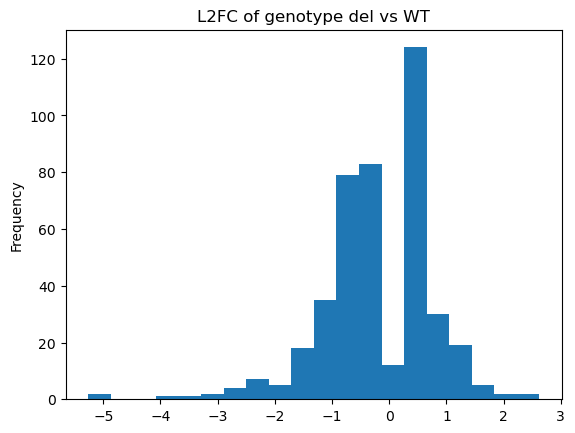

In [85]:
summarize_l2fg(stat_res['genotype'])

## L2FG - Strain

Perc Positive (L2FC>0): 0.93% (3.271 or 9.65x)
Perc Negative (L2FC<0): 0.94% (-1.461 or 0.36x)
Mean L2FC: 0.886
Std Dev L2FC: 3.266
Mean Change: 1.848
Mean Change (oposite): 0.541
    


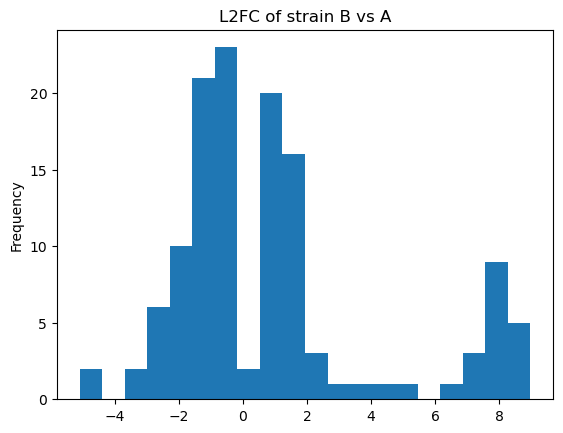

In [87]:
summarize_l2fg(stat_res['strain'])

## L2FG - Media

Perc Positive (L2FC>0): 1.10% (0.442 or 1.36x)
Perc Negative (L2FC<0): 1.25% (-0.891 or 0.54x)
Mean L2FC: -0.266
Std Dev L2FC: 0.833
Mean Change: 0.832
Mean Change (oposite): 1.202
    


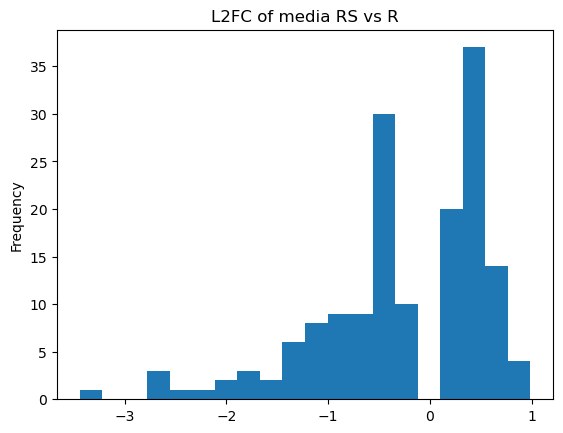

In [88]:
summarize_l2fg(stat_res['media'])

## L2FG - Time

Perc Positive (L2FC>0): 42.28% (1.871 or 3.66x)
Perc Negative (L2FC<0): 42.87% (-1.934 or 0.26x)
Mean L2FC: -0.044
Std Dev L2FC: 2.301
Mean Change: 0.970
Mean Change (oposite): 1.031
    


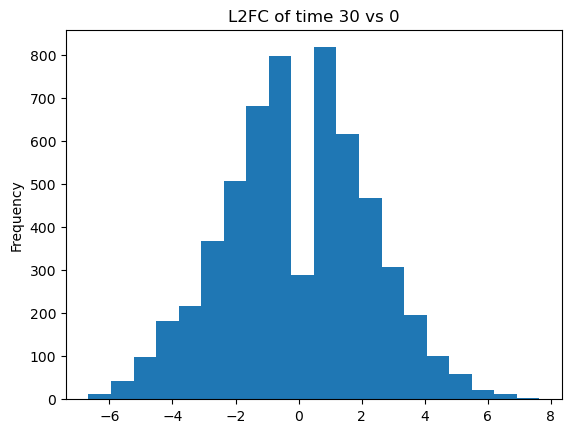

In [89]:
summarize_l2fg(stat_res['time_30_0'])

Perc Positive (L2FC>0): 40.90% (1.242 or 2.37x)
Perc Negative (L2FC<0): 41.34% (-1.089 or 0.47x)
Mean L2FC: 0.070
Std Dev L2FC: 1.387
Mean Change: 1.050
Mean Change (oposite): 0.952
    


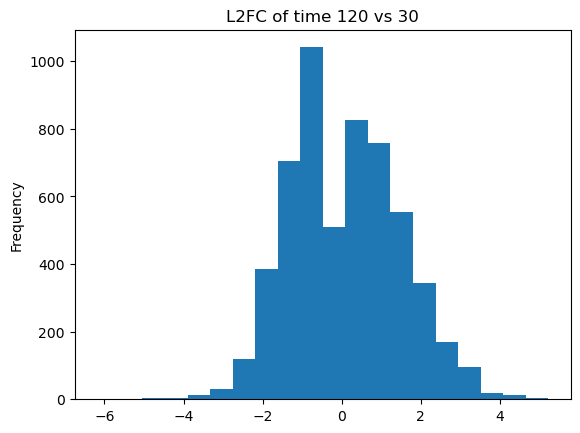

In [90]:
summarize_l2fg(stat_res['time_120_30'])

Perc Positive (L2FC>0): 29.82% (0.726 or 1.65x)
Perc Negative (L2FC<0): 31.18% (-0.597 or 0.66x)
Mean L2FC: 0.050
Std Dev L2FC: 0.810
Mean Change: 1.035
Mean Change (oposite): 0.966
    


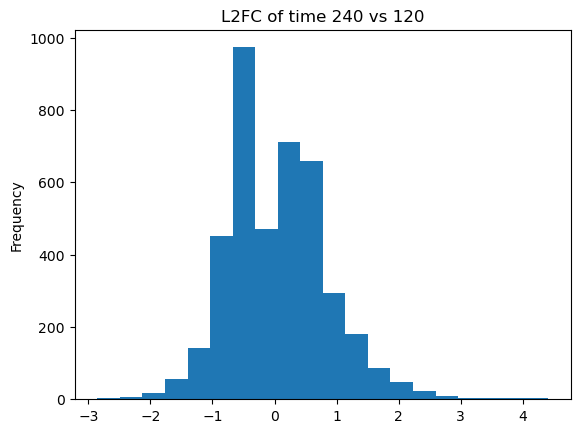

In [91]:
summarize_l2fg(stat_res['time_240_120'])

## L2FG - Genotype vs Time

Impact on deleting the genotype GT201. It should be negative.

Perc Positive (L2FC>0): 3.30% (0.924 or 1.90x)
Perc Negative (L2FC<0): 1.85% (-0.859 or 0.55x)
Mean L2FC: 0.282
Std Dev L2FC: 0.936
Mean Change: 1.216
Mean Change (oposite): 0.823
    


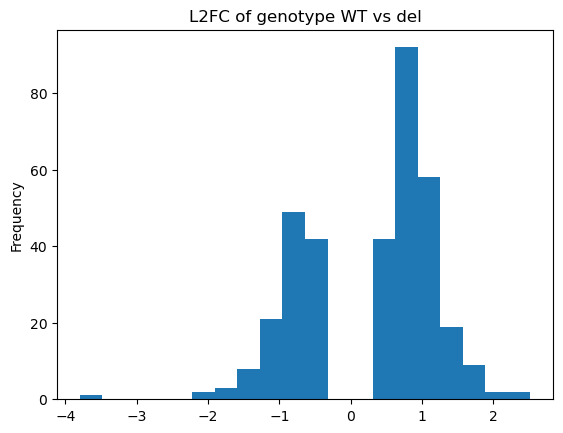

In [92]:
summarize_l2fg(stat_res['genotype|time_0'])

Perc Positive (L2FC>0): 8.84% (0.623 or 1.54x)
Perc Negative (L2FC<0): 10.04% (-0.549 or 0.68x)
Mean L2FC: 0.000
Std Dev L2FC: 0.674
Mean Change: 1.000
Mean Change (oposite): 1.000
    


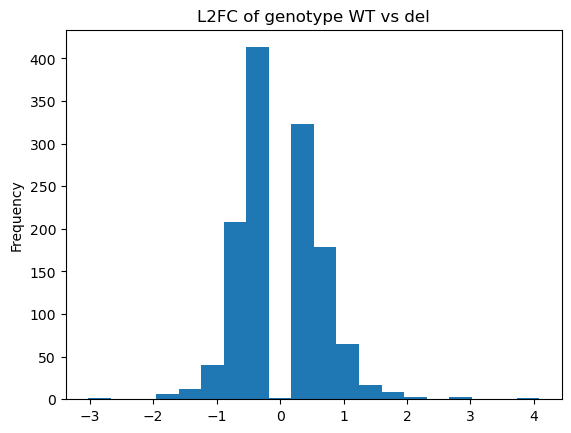

In [93]:
summarize_l2fg(stat_res['genotype|time_30'])

Perc Positive (L2FC>0): 9.23% (0.714 or 1.64x)
Perc Negative (L2FC<0): 8.52% (-0.595 or 0.66x)
Mean L2FC: 0.085
Std Dev L2FC: 0.804
Mean Change: 1.061
Mean Change (oposite): 0.943
    


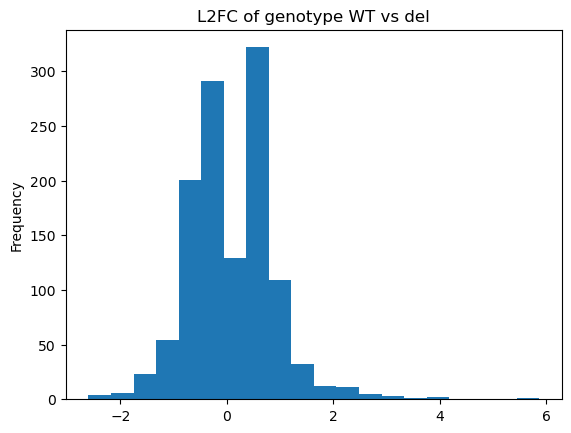

In [94]:
summarize_l2fg(stat_res['genotype|time_120'])

Perc Positive (L2FC>0): 20.69% (0.699 or 1.62x)
Perc Negative (L2FC<0): 21.94% (-0.560 or 0.68x)
Mean L2FC: 0.051
Std Dev L2FC: 0.808
Mean Change: 1.036
Mean Change (oposite): 0.965
    


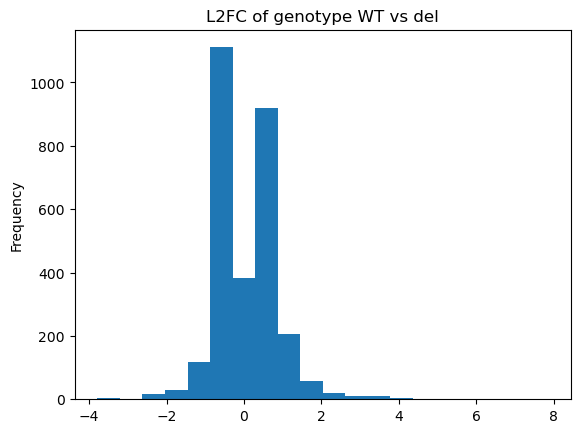

In [95]:
summarize_l2fg(stat_res['genotype|time_240'])

# Analysis: Gene Consistency

In [96]:
def funnel_gene(g1, g2):
    len_input = len(g1)
    g2_new_idx = [i in g2 for i in g1]
    g2_new = np.array(g1)[g2_new_idx]
    len_intersect = sum(g2_new_idx)
    len_not_intersect = len_input - len_intersect
    
    perc_intersect = len_intersect/len_input

    return len_intersect, perc_intersect, g2_new

## Time Changes

In [97]:
gene_cons = {}

In [98]:
gene_cons['time_change'] = {}
for motif in ['time_30_0', 'time_120_30', 'time_240_120']:
    sig_res = stat_res[motif].results_df['log2FoldChange'][stat_res[motif].p_values<0.05]


    gene_cons['time_change'][motif] = {
                    'sig': np.array(sig_res.index),
                    'pos': np.array(sig_res[sig_res>0].index),
                    'neg':  np.array(sig_res[sig_res<0].index)
                }

In [100]:
data_funnel_time = []

target = 'neg'
g1 = gene_cons['time_change']['time_30_0'][target]
g2 = gene_cons['time_change']['time_120_30'][target]
g3 = gene_cons['time_change']['time_240_120'][target]

perc_1 = len(g1)/df_counts_fin.shape[1]
total_2, perc_2, g2_new = funnel_gene(g1, g2)
total_3, perc_3, g3_new = funnel_gene(g2_new, g3)

data_funnel_time.append({
    'time': 30,
    'percentage': perc_1,
    'L2FC': target
})
data_funnel_time.append({
    'time': 120,
    'percentage': perc_2,
    'L2FC': target
})
data_funnel_time.append({
    'time': 240,
    'percentage': perc_3,
    'L2FC': target
})

In [101]:
df_funnel_time = pd.DataFrame(data_funnel_time)

In [102]:
df_funnel_time['time'] = df_funnel_time['time'].astype(str)

In [104]:
df_funnel_time['%Percentage'] = df_funnel_time['percentage'].apply(lambda x: round(x*100, ndigits=2))

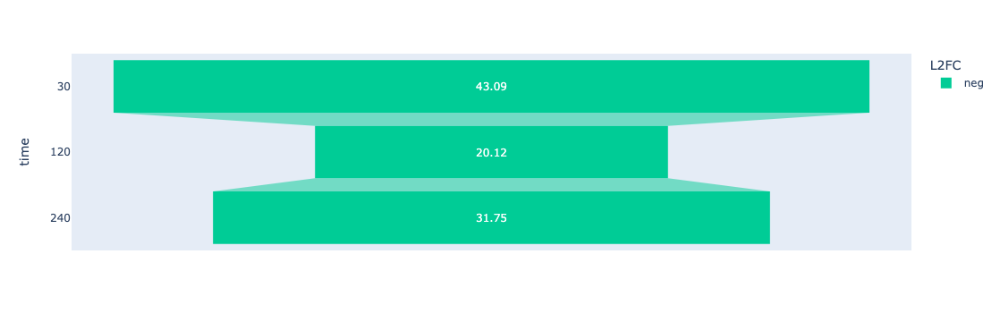

In [105]:
import plotly.express as px

fig = px.funnel(df_funnel_time, x = '%Percentage', y = 'time', color = 'L2FC',
                color_discrete_map = {'C1': '#FFDD71', 'C2': '#9FCD99'})
fig.update_traces(textfont = {'color': 'white'})

fig.show()

## L2FG - Media vs Time

Perc Positive (L2FC>0): 1.12% (0.449 or 1.37x)
Perc Negative (L2FC<0): 3.72% (-1.243 or 0.42x)
Mean L2FC: -0.852
Std Dev L2FC: 1.029
Mean Change: 0.554
Mean Change (oposite): 1.805
    


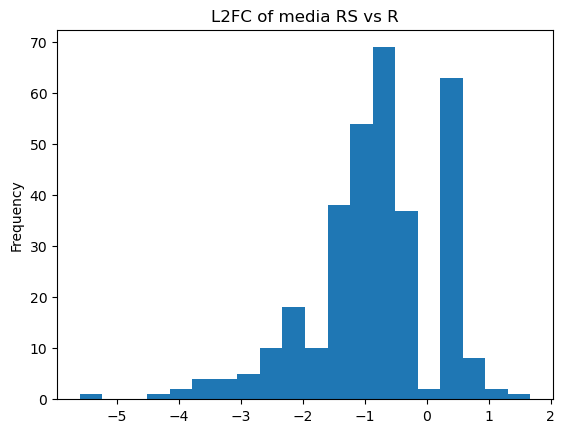

In [106]:
summarize_l2fg(stat_res['media|time_30'])

Perc Positive (L2FC>0): 9.05% (0.577 or 1.49x)
Perc Negative (L2FC<0): 4.96% (-0.574 or 0.67x)
Mean L2FC: 0.170
Std Dev L2FC: 0.690
Mean Change: 1.125
Mean Change (oposite): 0.889
    


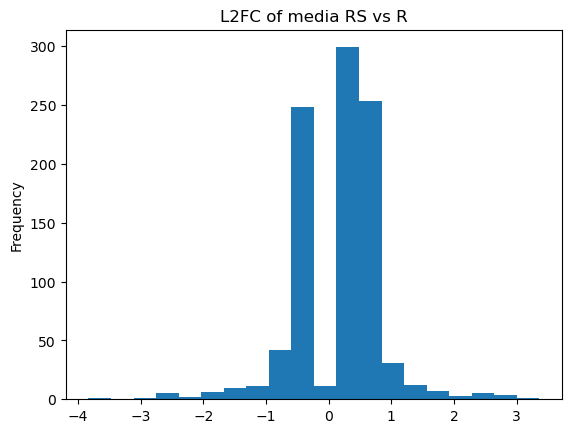

In [107]:
summarize_l2fg(stat_res['media|time_120'])

Perc Positive (L2FC>0): 8.20% (0.525 or 1.44x)
Perc Negative (L2FC<0): 7.45% (-0.536 or 0.69x)
Mean L2FC: 0.020
Std Dev L2FC: 0.607
Mean Change: 1.014
Mean Change (oposite): 0.986
    


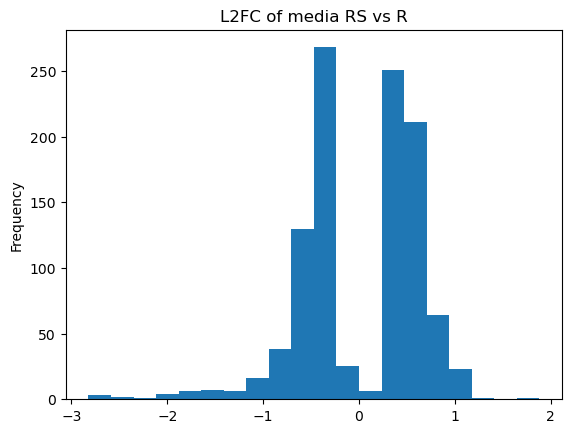

In [108]:
summarize_l2fg(stat_res['media|time_240'])

In [109]:
idx_1 = df_count_meta['time']==0
idx_2 = df_count_meta['time']==30
idx_3 = df_count_meta['time']==120
idx_4 = df_count_meta['time']==240

In [110]:
np.concatenate(df_counts_fin[idx_1].values).mean()

531.5220014716704

In [111]:
np.concatenate(df_counts_fin[idx_2].values).mean()

726.0840599705666

In [112]:
np.concatenate(df_counts_fin[idx_3].values).mean()

806.6888337012509

In [113]:
np.concatenate(df_counts_fin[idx_4].values).mean()

778.331438557763

# Simulate the prediction

In [118]:
from scipy.stats import nbinom

In [119]:
def estimate_n_p_method_of_moments(data):
    """ 
    Estimate parameters of Neg Binom using method of moments.
    
    Parameters:
    - data: array-like, the sample data.
    
    Returns:
    - n: estimated number of successes.
    - p: estimated probability of success.
    """
    mean = np.mean(data)
    var = np.var(data, ddof=1)
    
    p = mean / var
    n = (mean ** 2) / (var - mean)
    
    return n, p

def nb_simulate_disp(beta, mu, disp, num_samples=1000, confidence_level=0.95):
    """
    Perform inference using coefficients, mean vector, and Hessian matrix of a previously fitted negative binomial GLM.

    Parameters:
    - beta: np.array, coefficients from the fitted model.
    - mu: np.array, mean vector from the fitted model.
    - hessian: np.array, Hessian matrix from the fitted model.
    - num_samples: int, number of samples to draw from the negative binomial distribution for inference (default is 1000).
    - confidence_level: float, the confidence level for the confidence intervals (default is 0.95).

    Returns:
    - mean_predictions: np.array, predicted means for the new data.
    - lower_bound: np.array, lower bound of the confidence intervals.
    - upper_bound: np.array, upper bound of the confidence intervals.
    """
    
    # Mean predictions are already provided as mu
    mean_predictions = mu

    # Compute the variance
    variance = mean_predictions + mean_predictions**2 / disp

    # Parameters for scipy.stats.nbinom
    n = 1 / disp  # shape parameter
    p = n / (n + mean_predictions)  # probability parameter

    # Draw samples
    samples = nbinom.rvs(n, p, size=(num_samples, len(mu)))

    # Compute confidence intervals
    lower_bound = np.percentile(samples, (1 - confidence_level) / 2 * 100, axis=0)
    upper_bound = np.percentile(samples, (1 + confidence_level) / 2 * 100, axis=0)

    return mean_predictions, lower_bound, upper_bound

In [120]:
def generate_prediction(dds, df, padj=None):
    y_true_all = []
    y_pred_all = []
    y_p_lb_all = []
    y_p_ub_all = []

    if padj is not None:
        padj_nonzero = padj.loc[dds.non_zero_genes]
        sig_idx = np.where(padj_nonzero<0.05)[0]
    else:
        sig_idx = range(len(dds.non_zero_genes))
        
    mu_LFC_ = dds.obsm["_mu_LFC"]
    LFC_ = dds.varm["LFC"].loc[dds.non_zero_genes]
    dispersions_ = dds.varm["dispersions"][dds.non_zero_idx]
    # fitted_dispersions_ = dds.varm["fitted_dispersions"].loc[dds.non_zero_genes]
    
    for gene_id in tqdm(sig_idx):
        mu_ = mu_LFC_[:,gene_id]
        beta_ = LFC_.iloc[gene_id].values
        disp = dispersions_[gene_id]
        # disp = fitted_dispersions_[gene_id]
        
        H_ = dds.obsm['_hat_diagonals'][:,gene_id]
    
        # # index for data
        # non_zero_idx = dds.non_zero_idx
        # gene_id_idx = non_zero_idx[gene_id]
    
        if disp >= 0:
            
            # y_true = df.iloc[gene_id_idx].values[6:]
            y_true = dds.X[:, gene_id]
            y_pred, y_p_lb, y_p_ub = nb_simulate_disp(beta_,
                       mu_,
                       disp)
        
            y_true_all.append(y_true)
            y_pred_all.append(y_pred)
            y_p_lb_all.append(y_p_lb)
            y_p_ub_all.append(y_p_ub)
    
    y_true_all = np.concatenate(y_true_all)
    y_pred_all = np.concatenate(y_pred_all)
    y_p_lb_all = np.concatenate(y_p_lb_all)
    y_p_ub_all = np.concatenate(y_p_ub_all)
    
    return (y_true_all, y_pred_all, y_p_lb_all, y_p_ub_all)

def compute_mae(y_true, y_pred):
    res = np.mean(abs(y_true - y_pred))
    return res

In [121]:
y_data = {}
for key in tqdm(dds,desc='KEYS'):
    res = generate_prediction(dds[key], df_counts)
    y_data[key] = {
        'y_true': res[0],
        'y_pred': res[1],
        'y_pred_lb': res[2],
        'y_pred_ub': res[3],
    }

# y_data = {}
# for key in ['genotype|time_0', 'genotype|time_30', 'genotype|time_120', 'genotype|time_240']:
#     res = generate_prediction(dds[key], df_counts)
#     y_data[key] = {
#         'y_true': res[0],
#         'y_pred': res[1],
#         'y_pred_lb': res[2],
#         'y_pred_ub': res[3],
#     }

KEYS:   0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/6783 [00:00<?, ?it/s]

  0%|          | 0/6783 [00:00<?, ?it/s]

  0%|          | 0/6783 [00:00<?, ?it/s]

  0%|          | 0/6783 [00:00<?, ?it/s]

  0%|          | 0/6783 [00:00<?, ?it/s]

  0%|          | 0/6783 [00:00<?, ?it/s]

  0%|          | 0/6779 [00:00<?, ?it/s]

  0%|          | 0/6780 [00:00<?, ?it/s]

  0%|          | 0/6776 [00:00<?, ?it/s]

  0%|          | 0/6782 [00:00<?, ?it/s]

  0%|          | 0/6778 [00:00<?, ?it/s]

  0%|          | 0/6775 [00:00<?, ?it/s]

  0%|          | 0/6774 [00:00<?, ?it/s]

  0%|          | 0/6764 [00:00<?, ?it/s]

  0%|          | 0/6769 [00:00<?, ?it/s]

  0%|          | 0/6775 [00:00<?, ?it/s]

  0%|          | 0/6774 [00:00<?, ?it/s]

  0%|          | 0/6764 [00:00<?, ?it/s]

In [122]:
mae_all = []
for key in y_data:
    mae = compute_mae(y_data[key]['y_true'], y_data[key]['y_pred'])
    mae_all.append({
        'motif': key,
        'mae': mae
    })

In [123]:
pd.DataFrame(mae_all)

,motif,mae
0,strain,1001.416254
1,media,1006.389978
2,time,992.306391
3,genotype,1000.679962
4,media:time,991.835942
5,genotype:time,993.170644
6,time_30_0,936.843413
7,time_120_0,947.834840
8,time_240_0,932.660615
9,time_120_30,1045.218732


# QQ Plot

In [125]:
def viz_qq_time(y_data, t):
    n, p = estimate_n_p_method_of_moments(np.concatenate(df_counts_fin[df_count_meta['time']==t].values))
    motif_code = f'genotype|time_{t}'
    qq_plot(y_data[motif_code]['y_pred'], 
            lb_data=y_data[motif_code]['y_pred_lb'], 
            ub_data=y_data[motif_code]['y_pred_ub'], 
            distribution='nbinom', params=(n, p),
            title=f"QQ Plot GLM NB on GAT201|Time {t}")

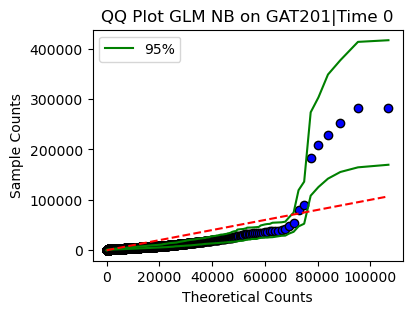

In [842]:
t = 0
viz_qq_time(y_data, t)
plt.savefig(f'plot_qq_deseq2_{t}.png', bbox_inches="tight")
plt.show()

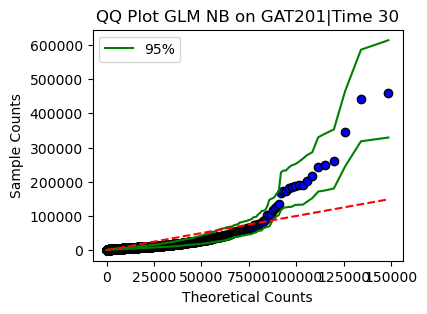

In [843]:
t = 30
viz_qq_time(y_data, t)

plt.savefig(f'plot_qq_deseq2_{t}.png', bbox_inches="tight")

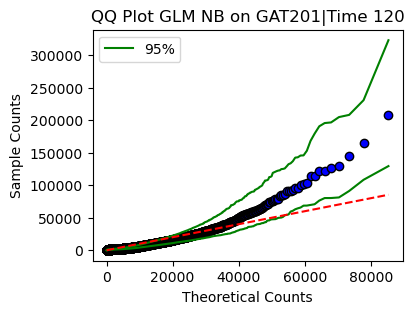

In [844]:
t = 120
viz_qq_time(y_data, t)

plt.savefig(f'plot_qq_deseq2_{t}.png', bbox_inches="tight")

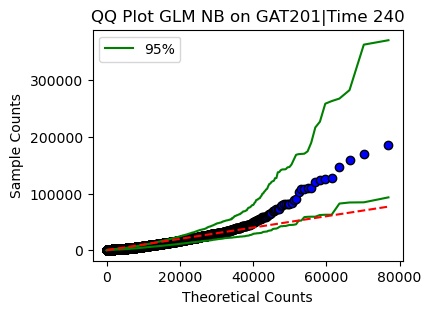

In [845]:
t = 240
viz_qq_time(y_data, t)

plt.savefig(f'plot_qq_deseq2_{t}.png', bbox_inches="tight")

# QQ Plot for Significant genes only

In [130]:
y_data_sig = {}
for key in ['genotype|time_0', 'genotype|time_30', 'genotype|time_120', 'genotype|time_240']:
    # sig_idx = np.where(stat_res[key].padj<0.05)[0]
    res = generate_prediction(dds[key], df_counts, padj=stat_res[key].padj)
    y_data_sig[key] = {
        'y_true': res[0],
        'y_pred': res[1],
        'y_pred_lb': res[2],
        'y_pred_ub': res[3],
    }

  0%|          | 0/350 [00:00<?, ?it/s]

  0%|          | 0/1283 [00:00<?, ?it/s]

  0%|          | 0/1206 [00:00<?, ?it/s]

  0%|          | 0/2897 [00:00<?, ?it/s]

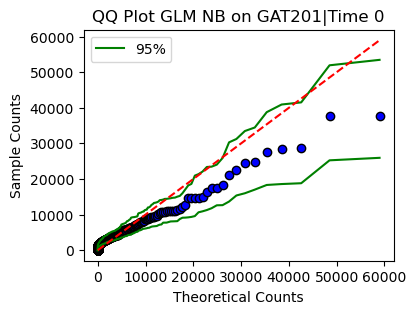

In [131]:
viz_qq_time(y_data_sig, 0)

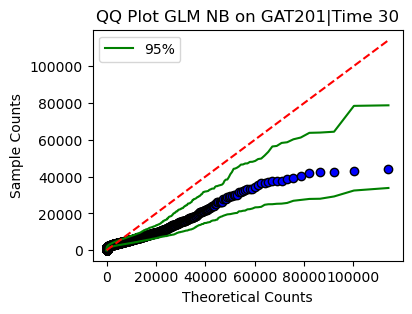

In [132]:
viz_qq_time(y_data_sig, 30)

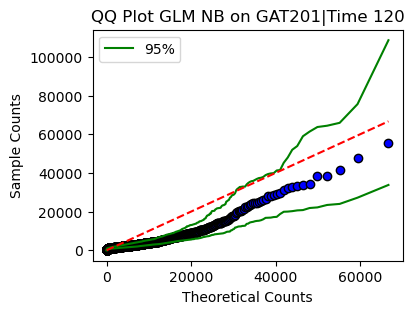

In [133]:
viz_qq_time(y_data_sig, 120)

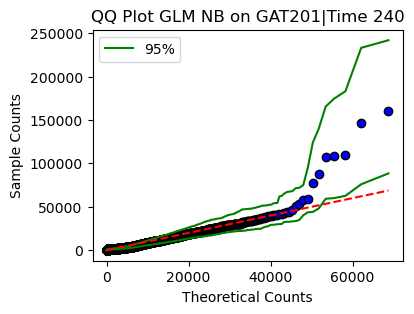

In [134]:
viz_qq_time(y_data_sig, 240)

# Residual Plot

In [135]:
# plot_residuals_vs_fitted(y_data['genotype|time_0']['y_true'], 
#                          y_data['genotype|time_0']['y_pred'])


In [136]:
# plot_residuals_vs_fitted(y_data_sig['genotype|time_0']['y_true'], 
#                          y_data_sig['genotype|time_0']['y_pred'])

In [137]:
# plot_residuals_vs_fitted(y_data_sig['genotype|time_30']['y_true'], 
#                          y_data_sig['genotype|time_30']['y_pred'])

In [138]:
# plot_residuals_vs_fitted(y_data_sig['genotype|time_120']['y_true'], 
#                          y_data_sig['genotype|time_120']['y_pred'])

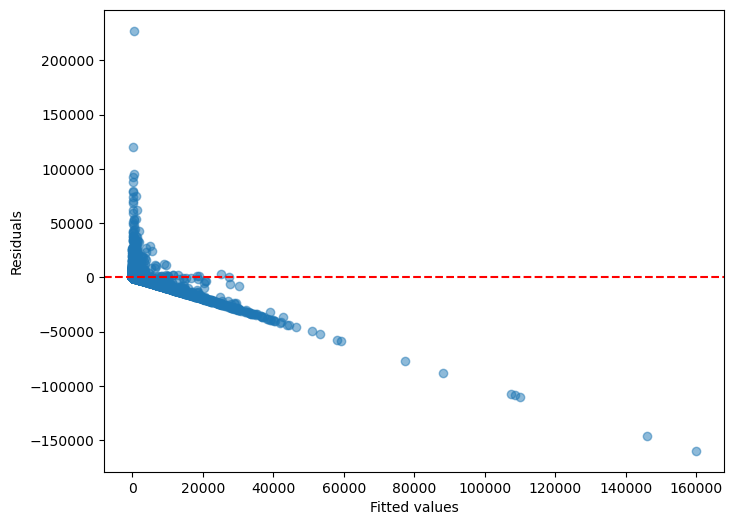

In [1208]:
plot_residuals_vs_fitted(y_data_sig['genotype|time_240']['y_true'], 
                         y_data_sig['genotype|time_240']['y_pred'])

# Kmers Model Setup

Fit Kmers to L2FG

In [140]:
from sklearn.preprocessing import MinMaxScaler

import statsmodels.formula.api as smf
from itertools import combinations
# # from sklearn.linear_model import LinearRegression, Lasso
# from statsmodels.regression.linear_model import OLS.fit_regularized

In [141]:
def lm_get_sig(model):
    res = model.summary2().tables[1]
    res_sig = res[res['P>|t|']<=0.05]
    return res, res_sig

def get_model_summary(model, predictor):
    tabs = model.summary2().tables[0][3]
    adjR = float(tabs[0])
    aic = float(tabs[1])
    bic = float(tabs[2])
    nll = -float(tabs[3])
    r = {
        'predictor': predictor,
        'adjR': adjR,
        'aic': aic,
        'bic': bic,
        'nll': nll
    }
    return r
def get_model_summary2(model, predictor):
    tabs = model.summary2().tables[0][3]
    adjR = float(tabs[0])
    aic = float(tabs[1])
    bic = float(tabs[2])
    nll = -float(tabs[3])
    r = {
        'predictor': predictor,
        'adjR': adjR,
        'aic': aic,
        'bic': bic,
        'nll': nll
    }
    return r

def do_scale_df(df):
    data_kmer_scaled = MinMaxScaler().fit_transform(df)
    df_scaled = pd.DataFrame(data_kmer_scaled, index=df.index, columns=df.columns)
    return df_scaled


In [142]:
models = {}
df_kmers_leaderboard = {}
label = 'genotype_WT_vs_del'

LFC = dds['genotype|time_240'].varm["LFC"].loc[dds['genotype|time_240'].non_zero_genes]
L2FC = LFC / np.log(2)

# Fit Base Model KMERS

In [143]:
for k_ in [2,3,4,5]:
    df_kmer = df_k[k_].set_index('Gene')

    df_kmers_leaderboard[f'k{k_}'] = []
    
    # Scaling & Merge with L2FC
    df_kmer_scaled = do_scale_df(df_kmer)
    df_kmer_scaled_label = pd.merge(L2FC.drop('intercept', axis=1), df_kmer_scaled, left_index=True, right_index=True)

    # Fit BIG MODEL
    predictor = df_kmer_scaled_label.columns.difference([label])
    fml = f"{label} ~ " + " + ".join(predictor)
    
    models[f'ols_k{k_}'] = smf.ols(fml, df_kmer_scaled_label).fit()

In [153]:
pd.DataFrame([get_model_summary(models[f'ols_k{k_}'], f'k{k_}') for k_ in [2,3,4,5]]).sort_values('aic')

,predictor,adjR,aic,bic,nll
2,k4,0.061,11319.8210,12254.0342,5522.9
1,k3,0.035,11405.9984,11631.0279,5670.0
3,k5,0.087,11486.0317,14984.2167,5230.0
0,k2,0.011,11545.9280,11620.9378,5762.0


# Analysis on Significant Kmers

In [154]:
'AAATT' in lm_get_sig(models[f'ols_k5'])[1].index

False

In [155]:
'AGATC' in lm_get_sig(models[f'ols_k5'])[1].index

False

- AAATT and AGATC, both independently are not significant during the modelling
- However, if the model takes only that two combination, it improve the AIC a lot.


In [156]:
lm_get_sig(models[f'ols_k5'])[0].loc[['AAATT', 'AGATC']]
# And the pval for AAATT also high.

,Coef.,Std.Err.,t,P>|t|,[0.025,0.975]
AAATT,-0.091551,0.614571,-0.148968,0.881584,-1.296323,1.113220
AGATC,0.666692,0.507143,1.314603,0.188692,-0.327483,1.660868


Performance: AAATT+AGATC	0.044	11311.1978	11331.6550	5652.6

- We can't use a simple p-value to select the combination of the model.



# Viterbi Algotrithm

In [168]:
def run_viterbi(df, L2FC, depth, metric='aic', k_tol=20, early_stop_diff=1, patience=2, resume_best=None,
               reduced_k_tol=None):
    ldb_vt = {}
    best_path = {}

    is_stop = False
    
    # Prepare Dataset
    df_kmer = df.set_index('Gene')
    
    # Scaling
    data_kmer_scaled = MinMaxScaler().fit_transform(df_kmer)
    df_kmer_scaled = pd.DataFrame(data_kmer_scaled, index=df_kmer.index, columns=df_kmer.columns)
    df_kmer_scaled_label = pd.merge(L2FC.drop('intercept', axis=1), df_kmer_scaled, left_index=True, right_index=True)

    # Get the individual predictor
    predictor = df_kmer_scaled_label.columns.difference([label])

    if resume_best is not None:
        prev_iter = len(resume_best[0].split('+'))
    else:
        prev_iter = 1

    best_val_curr = 0
        
    for d in range(prev_iter, depth+1):
        ldb_vt[d] = []
    
        if d <= prev_iter:
            best_path_prev = resume_best
        else:
            best_path_prev = best_path[d-1]
            
        if not best_path_prev:
            for kmer in tqdm(predictor, desc=f'D-{d}:Init'):
                fml = f"{label} ~ {kmer}"
                model_temp = smf.ols(fml, df_kmer_scaled_label).fit()
                summary = get_model_summary(model_temp, kmer)
                ldb_vt[d].append(summary)
        else:
            for best_path_cursor in tqdm(best_path_prev, desc=f'D:{d}-{metric}:{best_val_curr:.2f}'):
                for kmer in predictor:
                    if kmer in best_path_cursor.split('+')
                        continue
                    predictor_local = f"{best_path_cursor}+{kmer}"
                    fml = f"{label} ~ {predictor_local}"
                    model_temp = smf.ols(fml, df_kmer_scaled_label).fit()
                    summary = get_model_summary(model_temp, predictor_local)
                    ldb_vt[d].append(summary)

        if reduced_k_tol is not None:
            if d >= reduced_k_tol[1]:
                k_tol = reduced_k_tol[0]
    
        best_path[d] = pd.DataFrame(ldb_vt[d]).sort_values('aic').head(k_tol)['predictor'].tolist()
        best_val_curr = pd.DataFrame(ldb_vt[d]).sort_values('aic').head(1)[metric].values[0]

        if d-1 in ldb_vt and d > patience:
            best_val_prev = pd.DataFrame(ldb_vt[d-1]).sort_values('aic').head(1)[metric].values[0]
            
            diff_val = best_val_prev - best_val_curr
            if diff_val < early_stop_diff:
                is_stop = True
                print("Early Stop")
                break
    print(f"Best Path: {best_path[d][0]}")
    return ldb_vt, is_stop

In [169]:
def run_viterbi_full(df, L2FC, ldb={}, k_tol=5, reduced_k_tol=[1, 10]):
    ldb = {}
    
    if len(ldb):
        final_iter = max(ldb.keys())
    else:
        final_iter = 0
    
    for pointer in range(0,101, 5):
        if pointer <= final_iter:
            continue
        
        if pointer > reduced_k_tol[1]:
            k_tol = reduced_k_tol[0]
        
        if final_iter:
            resume_data = pd.DataFrame(ldb[final_iter]).head(k_tol)['predictor'].tolist()
        else:
            resume_data = None
        ldb_res, is_stop = run_viterbi(df, L2FC, depth=pointer, metric='aic', k_tol=k_tol, 
                                    patience=5, resume_best=resume_data, reduced_k_tol=reduced_k_tol)
        
    
        for k in ldb_res:
            ldb[k] = ldb_res[k]
    
        final_iter = max(ldb.keys())

        if is_stop:
            break
    return ldb



# TIME 240

## Run for K:2,3,4,5 independently

In [159]:
LFC = dds['genotype|time_240'].varm["LFC"].loc[dds['genotype|time_240'].non_zero_genes]
L2FC = LFC / np.log(2)

ldb_all = {}
for k in tqdm([2,3,4,5], desc='K'):
    ldb_all[k] = {}
    ldb_all[k] = run_viterbi_full(df_k[k], L2FC, ldb_all[k], k_tol=5, reduced_k_tol=[1, 10])

In [1239]:
for d in [1,2,3,4,5]:
    df_d = pd.DataFrame(ldb_all[240][3][d]).sort_values('aic').head(1)
    print(df_d['predictor'].values[0], df_d['aic'].values[0])

AAT 11555.3251
ATC+AAT 11491.1159
AAT+ATC+AGG 11476.3193
CGC+ATC+AAT+AGG 11459.9384
CGC+ATC+AAT+AGG+AAG+CTA 11442.3966


Findings:
1. Best of depth 1 is AAT with AIC: 11,555.3251
2. Best of depth 2 is AAT+ATC with AIC: 11,491.1159
3. Best of depth 3 is AAT+ATC+AGG with AIC: 11,476.3193
4. Best of depth 4 is AAT+ATC+AGG+CGC with AIC: 11,459.9384
5. Best of depth 5 is AAT+ATC+AGG+CGC+CTA with AIC: 11,446.8677

Then, we can use Viterbi Algorithm to get more depth with fewer computations.

## Run for all kmers (combination)

In [160]:
df_k_full = df_k[2]

for k in [3,4,5]:
    df_k_full = pd.merge(df_k_full, df_k[k], on='Gene')

ldb_all['all'] = run_viterbi_full(df_k_full, L2FC, ldb_all['all'], k_tol=5, reduced_k_tol=[1, 10])

## Get Metrics Summary

In [161]:
def get_metric_summary(dict_metrics, ldb, k_code, metric='aic'):
    dict_metrics[k_code] = []
    for d in ldb:
        df_best_val = pd.DataFrame(ldb[d]).sort_values(metric).loc[0]
        if 'adjR' in df_best_val:
            c = 'adjR'
        else:
            c = 'padj'
        pkg = {
            'kmers': k_code,
            'depth': d,
            'adjR': df_best_val[c],
            'aic': df_best_val['aic'],
            'bic': df_best_val['bic'],
            'nll': df_best_val['nll']
        }
        dict_metrics[k_code].append(pkg)
    return dict_metrics


In [859]:
def vis_ldb(ldb_all, t=0, figsize=(8,4)):
    df_metrics = {}
    for k in [2,3,4,5, 'all']:
        df_metrics = get_metric_summary(df_metrics, ldb_all[k], k, metric='aic')
    
    
    # Code for visualization
    df_viz_metrics = pd.DataFrame(df_metrics[2])
    ax = df_viz_metrics.plot(x='depth', y='aic', label=None, c='gray', figsize=figsize)
    
    # Write a label
    x_label = df_viz_metrics.tail(1)['depth'].values[0] +1
    y_label = df_viz_metrics.tail(1)['aic'].values[0] + 10
    ax.text(x_label, y_label, f'K-2')
    
    
    for k in [3,4,5, 'all']:
        if k == 'all':
            clr = 'blue'
        else:
            clr = 'gray'
        df_viz_metrics = pd.DataFrame(df_metrics[k])
        df_viz_metrics.plot(x='depth', y='aic', label=None, ax=ax, c=clr)
    
        # Write a label
        x_label = df_viz_metrics.tail(1)['depth'].values[0] +1
        y_label = df_viz_metrics.tail(1)['aic'].values[0] + 10
        ax.text(x_label, y_label, f'K-{k}')
    
        
    plt.xlim(-1,100)
    
    plt.ylabel('AIC')
    plt.xlabel('Depth')
    ax.get_legend().remove()
    
    plt.title(f'Goodness of Fit: K-mers Sequences Model at T={t}')
    # plt.show()

# Run Viterbi across Time

In [165]:
def pipeline_viterbi(dds, time, sig_only=True):
    # Prepare the L2FC
    marker_code = f'genotype|time_{time}'
    LFC = dds[marker_code].varm["LFC"].loc[dds[marker_code].non_zero_genes]
    L2FC = LFC / np.log(2)

    if sig_only:
        # Select the Significant only
        padj_sig = stat_res[key].padj[dds[marker_code].non_zero_genes]
        sig_idx = padj_sig < 0.05
        L2FC = L2FC[sig_idx]        
    
    # Run Viterbi for 2,3,4,5
    ldb_all = {}
    for k in tqdm([2,3,4,5], desc='K'):
        ldb_all[k] = {}
        ldb_all[k] = run_viterbi_full(df_k[k], L2FC, ldb_all[k], k_tol=5, reduced_k_tol=[1, 10])
    
    ### Run Viterbi for all
    # Get Dataset
    df_k_full = df_k[2]
    
    for k in [3,4,5]:
        df_k_full = pd.merge(df_k_full, df_k[k], on='Gene')

    # Run all combination
    k = 'all'
    ldb_all[k] = {}
    ldb_all[k] = run_viterbi_full(df_k_full, L2FC, ldb_all[k], k_tol=5, reduced_k_tol=[1, 10])
    return ldb_all

In [1244]:
# Don't use it. It filters the sig value only
# ldb_all_t240 = pipeline_viterbi(dds, 240, sig_only=True)
# ldb_all_t30 = pipeline_viterbi(dds, 30, sig_only=True)
# ldb_all_t0 = pipeline_viterbi(dds, 0, sig_only=True)
# ldb_all_t120 = pipeline_viterbi(dds, 120, sig_only=True)

In [173]:
# This code should be run, but it takes time. Instead, load the saved result

# ldb_all_t240_all = pipeline_viterbi(dds, 240, sig_only=False)
# ldb_all_t30_all = pipeline_viterbi(dds, 30, sig_only=False)
# ldb_all_t0_all = pipeline_viterbi(dds, 0, sig_only=False)
# ldb_all_t120_all = pipeline_viterbi(dds, 120, sig_only=False)

# Code to save the result
# with open('ldb_all_t120_all.pickle', 'wb') as fp:
#     pickle.dump(ldb_all_t120_all, fp)


# Load result, instead
ldb_all = {}
for i in [0, 30, 120, 240]:
    with open(f'ldb_all_t{i}_all.pickle', 'rb') as fp:
        ldb_all[i] = pickle.load(fp)


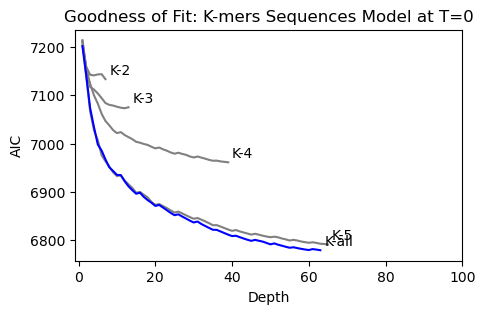

In [1246]:
t = 0
vis_ldb(ldb_all[t], t, figsize=(5,3))

plt.savefig(f'viterbi_t{t}.png', bbox_inches="tight")
plt.show()


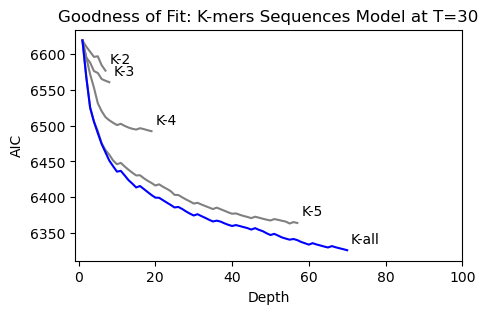

In [1247]:
t = 30
vis_ldb(ldb_all[t], t, figsize=(5,3))

plt.savefig(f'viterbi_t{t}.png', bbox_inches="tight")
plt.show()


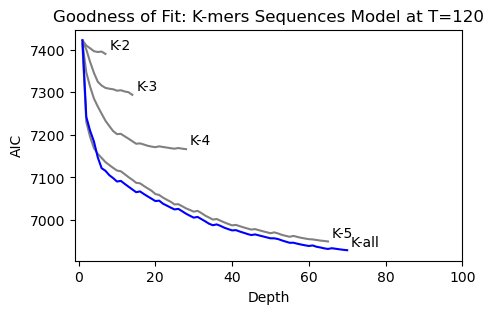

In [1248]:
t = 120
vis_ldb(ldb_all[t], t, figsize=(5,3))

plt.savefig(f'viterbi_t{t}.png', bbox_inches="tight")
plt.show()


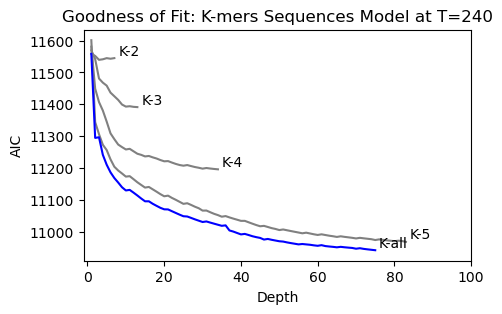

In [1249]:
t = 240
vis_ldb(ldb_all[t], t, figsize=(5,3))

plt.savefig(f'viterbi_t{t}.png', bbox_inches="tight")
plt.show()


# Analysis KMERS

In [244]:
def get_model_fin(dds, time, ldb):
    # Prepare the L2FC
    marker_code = f'genotype|time_{time}'
    LFC = dds[marker_code].varm["LFC"].loc[dds[marker_code].non_zero_genes]
    L2FC = LFC / np.log(2)

    # Select the Significant only
    padj_sig = stat_res[key].padj[dds[marker_code].non_zero_genes]
    sig_idx = padj_sig < 0.05
    L2FC = L2FC[sig_idx]    
    
    max_depth = max(ldb)
    
    df_k_full_scaled = do_scale_df(df_k_full.set_index('Gene'))
    df_k_full_scaled = pd.merge(L2FC.drop('intercept', axis=1), df_k_full_scaled, left_index=True, right_index=True)
    
    bp = pd.DataFrame(ldb[max_depth]).sort_values('aic').iloc[0]['predictor']
    
    best_model_fml = f"{label} ~ {bp}"
    
    model_best_raw = smf.ols(best_model_fml, df_k_full_scaled).fit()
    model_best = smf.ols(best_model_fml, df_k_full_scaled).fit()

    ii = 1
    while True:    
        model_best_col_sig = lm_get_sig(model_best)[1].index.difference(['Intercept'])
        model_best_sig_fml = f"{label} ~ " + "+".join(model_best_col_sig)
        
        model_best = smf.ols(model_best_sig_fml, df_k_full_scaled).fit()

        model_best_col_sig_2 = lm_get_sig(model_best)[1].index.difference(['Intercept'])

        if len(model_best_col_sig) == len(model_best_col_sig_2):
            break
        ii +=1
    
    return model_best_raw, model_best, df_k_full_scaled

In [245]:
model_raw_fin = {}
model_fin = {}

model_raw_fin[0], model_fin[0],_ = get_model_fin(dds, 0, ldb_all[0]['all'])
model_raw_fin[30], model_fin[30],_ = get_model_fin(dds, 30, ldb_all[30]['all'])
model_raw_fin[120], model_fin[120],_ = get_model_fin(dds, 120, ldb_all[120]['all'])
model_raw_fin[240], model_fin[240],_ = get_model_fin(dds, 240, ldb_all[240]['all'])

In [960]:
len(lm_get_sig(model_raw_fin[240])[0])-1

76

In [1136]:
df_model_fin_stat = pd.DataFrame([get_model_summary(model_fin[i], i) for i in [0, 30, 120, 240]])
df_model_fin_stat

,predictor,adjR,aic,bic,nll
0,0,0.048,2698.5610,2776.1896,1336.3
1,30,0.054,2851.6032,2953.1175,1408.8
2,120,0.113,3935.2263,4078.5407,1943.6
3,240,0.188,6425.5178,6664.3751,3172.8


In [1251]:
t = 0

df_kmer_res = model_raw_fin[t].summary2().tables[1].drop('Intercept')

df_temp = df_kmer_res.sort_values('Coef.', ascending=False).reset_index().rename(columns={'index':'Motif'})[['Motif', 'Coef.']]
df_temp.index = range(1, len(df_temp)+1)
df_temp['Coef.'] = df_temp['Coef.'].apply(lambda x: round(x, 2))

print(df_temp.to_latex().replace('0000', ''))

\begin{tabular}{llr}
\toprule
 & Motif & Coef. \\
\midrule
1 & AAAA & 1.78 \\
2 & CACAG & 0.26 \\
3 & AAA & 0.26 \\
4 & ACGCG & 0.21 \\
5 & ATCCA & 0.19 \\
6 & CATCC & 0.16 \\
7 & CAATG & 0.16 \\
8 & AACCC & 0.16 \\
9 & AAAG & 0.15 \\
10 & GACGC & 0.14 \\
11 & CAAC & 0.14 \\
12 & AAGG & 0.14 \\
13 & CTATA & 0.14 \\
14 & AAAGA & 0.12 \\
15 & CAGCC & 0.12 \\
16 & AGATC & 0.11 \\
17 & CATGA & 0.10 \\
18 & ACGGG & 0.10 \\
19 & ACACC & 0.10 \\
20 & ATTGC & 0.10 \\
21 & ACCGC & 0.08 \\
22 & GACCA & 0.07 \\
23 & AAACA & 0.06 \\
24 & ACGTG & 0.05 \\
25 & AAATC & 0.05 \\
26 & AGTCG & 0.04 \\
27 & TCCCA & 0.02 \\
28 & ATTCA & -0.00 \\
29 & AAACT & -0.01 \\
30 & AAACC & -0.01 \\
31 & CCACC & -0.03 \\
32 & ACTCA & -0.03 \\
33 & GATAC & -0.04 \\
34 & AAGTG & -0.05 \\
35 & CTTCA & -0.07 \\
36 & CGAAC & -0.07 \\
37 & ATCA & -0.07 \\
38 & GATCC & -0.07 \\
39 & CCAGC & -0.08 \\
40 & AAACG & -0.08 \\
41 & CAGGA & -0.08 \\
42 & GTCTA & -0.08 \\
43 & AAAC & -0.09 \\
44 & CCCAA & -0.09 \\
45 & AGCCT & -0.1

# Big Model

In [334]:
def fit_glm(df, formula, offset, alpha):
    if offset is None:
        model_glm = glm(formula=formula, 
                          data=df, 
                          family=sm.families.NegativeBinomial(alpha=alpha))
    else:
        model_glm = glm(formula=formula, 
                  data=df, 
                  family=sm.families.NegativeBinomial(alpha=alpha),
                 offset=offset)
    
    model_glm = model_glm.fit()
    
    return model_glm

In [336]:
df_main = get_encoded_df(df_counts, df_sample)

df_k_full_scaled = do_scale_df(df_k_full.set_index('Gene'))
df_k_full_big = df_k_full_scaled[df_k_full_scaled.columns.difference(['genotype_WT_vs_del'])]
df_k_full_scaled = pd.merge(L2FC.drop('intercept', axis=1), df_k_full_scaled, left_index=True, right_index=True)

df_k_full_scaled_with_index = df_k_full_scaled[df_k_full_scaled.columns.difference(['genotype_WT_vs_del'])].reset_index()
df_main_kmers = pd.merge(df_main, df_k_full_scaled_with_index, left_on='geneid', right_on='index')

In [338]:
predictors = {}
big_models = {}
for t in [0, 30, 120, 240]:
    predictor_one = f'genotype_WT'
    best_kmers = lm_get_sig(model_fin[t])[1].index.difference(['Intercept'])
    predictors[t] = [f"{predictor_one}:{p}" for p in best_kmers]
    
    disp_ = np.nanmean(dds[f'genotype|time_{t}'].varm['dispersions'])
    
    df_main_kmers['genotype_WT'] = df_main_kmers['genotype_WT'].astype(int)
    df_main_kmers[f'time_{t}'] = df_main_kmers[f'time_{t}'].astype(int)

    big_model_fml = "count ~ " + " + ".join(predictors[t])
    big_models[t] = fit_glm(df_main_kmers[df_main_kmers[f'time_{t}']==1], 
                        big_model_fml,  
                        df_main_kmers[df_main_kmers[f'time_{t}']==1]['count_log_median'], 
                        alpha=disp_)

In [994]:
df_big_model_summary = pd.DataFrame([glm_summary(big_models[t], t) for t in [0, 30, 120, 240]])

In [1001]:
df_big_model_summary['aic'] = df_big_model_summary['aic'].astype(int)
df_big_model_summary['nll'] = df_big_model_summary['nll'].astype(int)
df_big_model_summary['chi^2'] = df_big_model_summary['chi^2'].astype(int)
df_big_model_summary['r\^2'] = df_big_model_summary['r\^2'].apply(lambda x: round(x, 4))
df_big_model_summary.rename(columns={'model':'time'}, inplace=True)

In [1004]:
print(df_big_model_summary.to_latex())

\begin{tabular}{lrrrrr}
\toprule
 & time & aic & nll & r\^2 & chi^2 \\
\midrule
0 & 0 & 1557767 & 778871 & 0.566900 & 11053506 \\
1 & 30 & 3016998 & 1508482 & 0.517100 & 16241429 \\
2 & 120 & 2894774 & 1447363 & 0.500900 & 9354295 \\
3 & 240 & 3006460 & 1503190 & 0.745000 & 9207232 \\
\bottomrule
\end{tabular}



In [1252]:
print(big_models[0].summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  count   No. Observations:                54096
Model:                            GLM   Df Residuals:                    54083
Model Family:        NegativeBinomial   Df Model:                           12
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -7.7887e+05
Date:                Thu, 08 Aug 2024   Deviance:                   1.0229e+06
Time:                        21:18:26   Pearson chi2:                 1.11e+07
No. Iterations:                    14   Pseudo R-squ. (CS):             0.5669
Covariance Type:            nonrobust                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept             1.1025      0.00

In [1253]:
print(big_models[30].summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  count   No. Observations:               108192
Model:                            GLM   Df Residuals:                   108175
Model Family:        NegativeBinomial   Df Model:                           16
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -1.5085e+06
Date:                Thu, 08 Aug 2024   Deviance:                   1.9096e+06
Time:                        21:18:27   Pearson chi2:                 1.62e+07
No. Iterations:                    12   Pseudo R-squ. (CS):             0.5171
Covariance Type:            nonrobust                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept             1.4067      0.00

In [1254]:
print(big_models[120].summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  count   No. Observations:               108192
Model:                            GLM   Df Residuals:                   108168
Model Family:        NegativeBinomial   Df Model:                           23
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -1.4474e+06
Date:                Thu, 08 Aug 2024   Deviance:                   1.7140e+06
Time:                        21:18:28   Pearson chi2:                 9.35e+06
No. Iterations:                    17   Pseudo R-squ. (CS):             0.5009
Covariance Type:            nonrobust                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept             0.9903      0.00

In [1255]:
print(big_models[240].summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  count   No. Observations:               108192
Model:                            GLM   Df Residuals:                   108152
Model Family:        NegativeBinomial   Df Model:                           39
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -1.5032e+06
Date:                Thu, 08 Aug 2024   Deviance:                   1.8461e+06
Time:                        21:18:28   Pearson chi2:                 9.21e+06
No. Iterations:                    24   Pseudo R-squ. (CS):             0.7450
Covariance Type:            nonrobust                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept             1.0452      0.00

# Analysis Kmer on FInal Model / Big Model

In [1170]:
def extract_kmer_coef(model):
    df_coef_tgt = model.summary2().tables[1].drop('Intercept')
    kmer_neg = df_coef_tgt[df_coef_tgt['Coef.']<0]
    kmer_pos = df_coef_tgt[df_coef_tgt['Coef.']>0]
    return kmer_pos, kmer_neg
    
def get_intersect(l1, l2):
    r = [i for i in l1 if i in l2]
    return r


kmer_pos = {}
kmer_neg = {}
for i in [0, 30, 120, 240]:
    kmer_pos[i], kmer_neg[i] = extract_kmer_coef(big_models[i])
    
    kmer_pos[i].index = [i.replace("genotype_WT:", "") for i in kmer_pos[i].index]
    kmer_neg[i].index = [i.replace("genotype_WT:", "") for i in kmer_neg[i].index]



In [1173]:
# Check if there's intersection
times = [0, 30, 120, 240]
for t1 in times:
    for t2 in times:
        if t1 < t2:
            intersect_ = get_intersect(kmer_pos[t1].index, kmer_pos[t2].index)
            print(t1,t2, intersect_)


0 30 []
0 120 []
0 240 ['CGTCA']
30 120 ['AA']
30 240 ['TCCAA']
120 240 ['AGATC', 'GCCAC']


In [1174]:
# Check if there's intersection
times = [0, 30, 120, 240]
for t1 in times:
    for t2 in times:
        if t1 < t2:
            intersect_ = get_intersect(kmer_neg[t1].index, kmer_neg[t2].index)
            print(t1,t2, intersect_)


0 30 ['ACGCG']
0 120 ['ACGCG']
0 240 []
30 120 ['ACGCG']
30 240 []
120 240 ['AAGG']


In [1175]:
# Check if there's intersection between pos and negative across time
times = [0, 30, 120, 240]
for t1 in times:
    for t2 in times:
        if t1 < t2:
            intersect_ = get_intersect(kmer_pos[t1].index, kmer_neg[t2].index)
            print(t1,t2, intersect_)

0 30 ['ATGAC']
0 120 []
0 240 []
30 120 ['GGGAC']
30 240 ['AA']
120 240 ['AA']


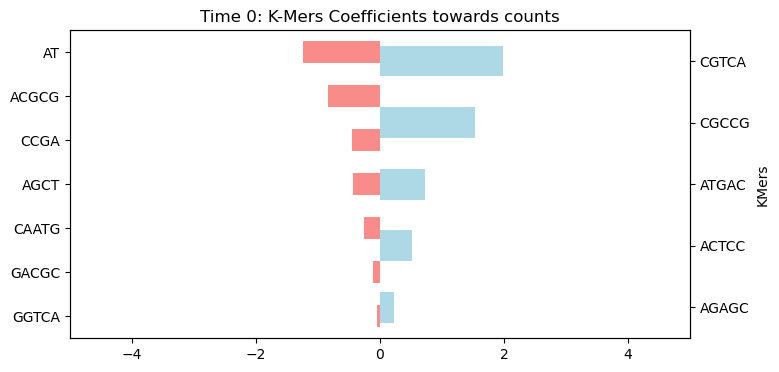

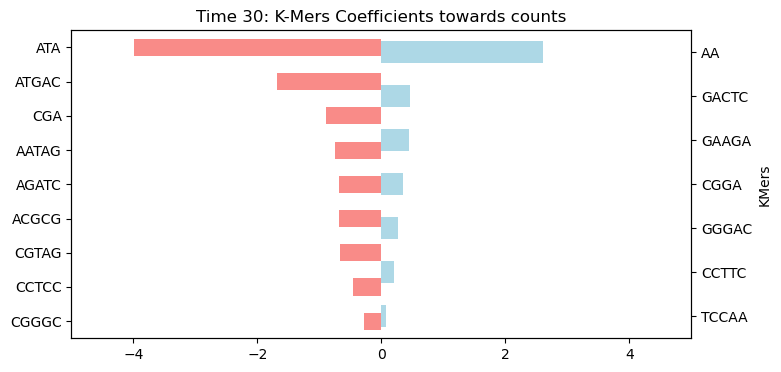

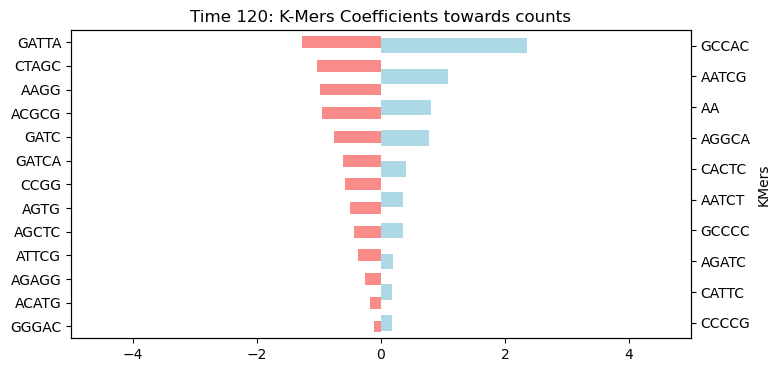

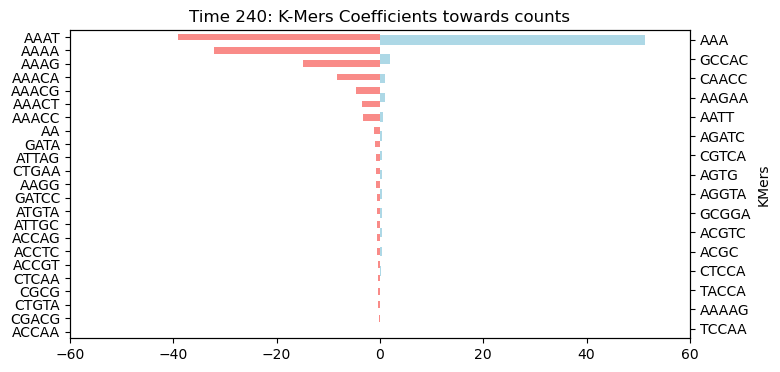

In [1180]:
for t in [0, 30, 120, 240]:
    fig = plt.figure(figsize=(8,4))
    ax = fig.add_subplot(111)
    ax2 = ax.twinx()
    
    kmer_pos[t].sort_values('Coef.', ascending=True)['Coef.'].plot.barh(color='#ADD8E6', ax=ax2)
    kmer_neg[t].sort_values('Coef.', ascending=False)['Coef.'].plot.barh(color='#F98B88',ax=ax)

    if t < 240:
        plt.xlim(-5, 5)
    else:
        plt.xlim(-60, 60)
    
    plt.ylabel('KMers')
    plt.xlabel('Coef.')
    
    plt.title(f'Time {t}: K-Mers Coefficients towards counts')
    plt.savefig(f'kmers_coef_fin_t{t}.png', bbox_inches="tight")
    
    plt.show()

# Why do I need Deseq2?
1. To decouple learning. Learn the Dispersion based on each genes, and takes the average
2. Reduce computation, finding the dispersion parameters could add more complexity of the viterbi algorithm. The computational complexity from O(DK) become O(DKG) where G is the grid search for dispersion parameters.

# Model Checking for Q2

In [1054]:
big_model_prediction = {}

for t in tqdm([0, 30, 120, 240]):
    bm_pred_ph  = big_models[t].get_prediction(df_main_kmers[df_main_kmers[f'time_{t}']==1], offset=df_main_kmers[df_main_kmers[f'time_{t}']==1]['count_log_median'])
    bm_pred = bm_pred_ph.summary_frame(alpha=0.05)
    
    big_model_prediction[f'genotype|time_{t}'] = {
        'y_pred': big_models[t].fittedvalues,
        'y_pred_lb': bm_pred['mean_ci_lower'].values,
        'y_pred_ub': bm_pred['mean_ci_upper'].values,
    }

  0%|          | 0/4 [00:00<?, ?it/s]

In [1106]:
def viz_qq_time_fin(y_data, t):
    n, p = estimate_n_p_method_of_moments(np.concatenate(df_counts_fin[df_count_meta['time']==t].values))
    # n, p = estimate_n_p_method_of_moments(np.concatenate(df_counts_fin[df_count_meta['time']==t].values))
    motif_code = f'genotype|time_{t}'
    qq_plot(y_data[motif_code]['y_pred'], 
            lb_data=y_data[motif_code]['y_pred_lb'], 
            ub_data=y_data[motif_code]['y_pred_ub'], 
            distribution='nbinom', params=(n, p),
            title=f"QQ Plot Final Model on GAT201|Time {t}")

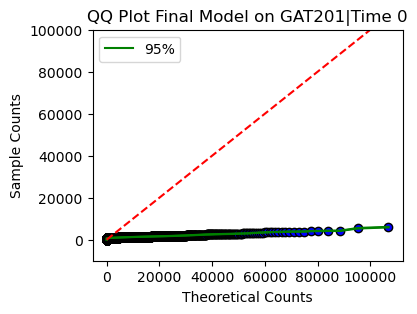

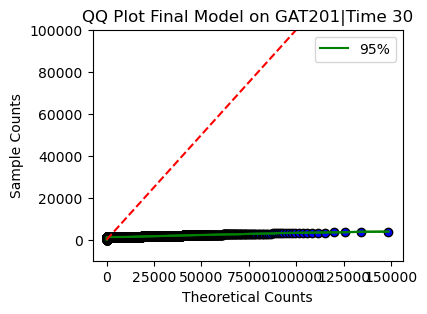

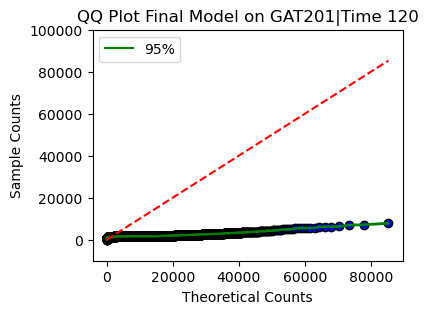

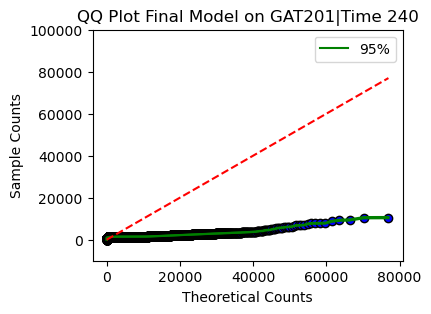

In [1139]:

for t in [0, 30, 120, 240]:
    viz_qq_time_fin(big_model_prediction, t)
    plt.ylim(-10000, 100000)

    plt.savefig(f'plot_fin_model_qqplot_{t}.png', bbox_inches="tight")
    
    plt.show()
    
    

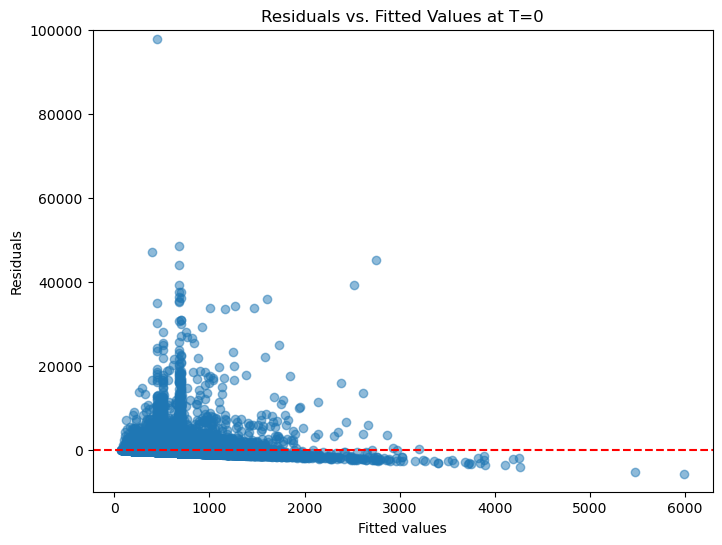

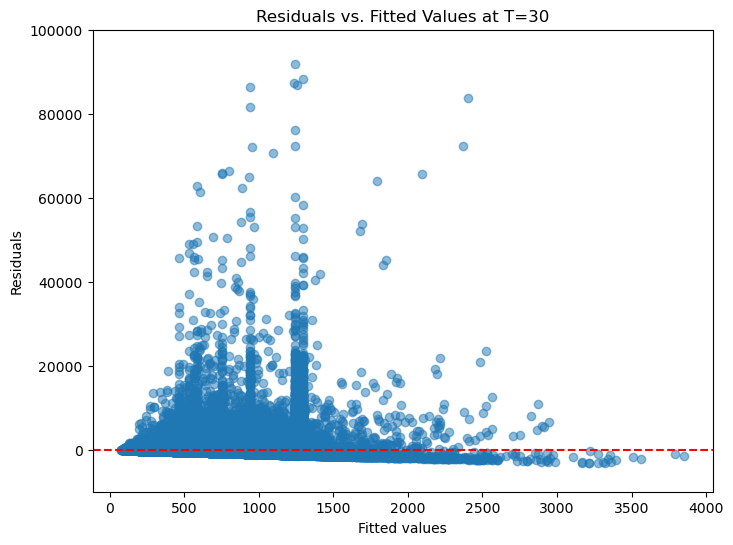

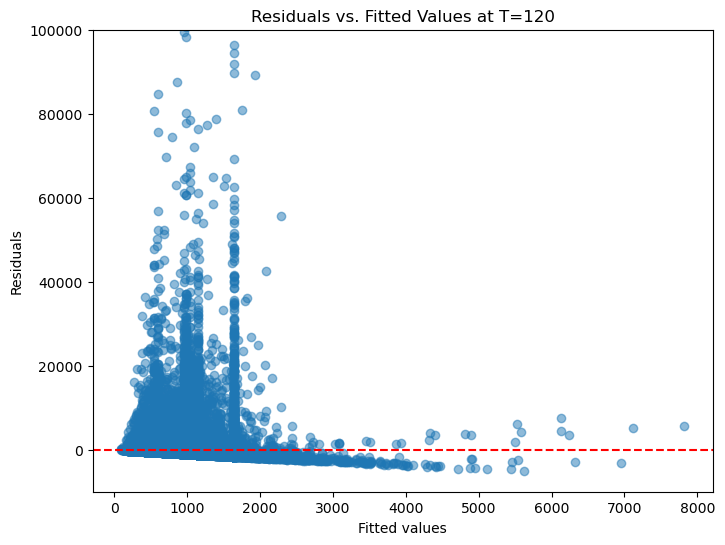

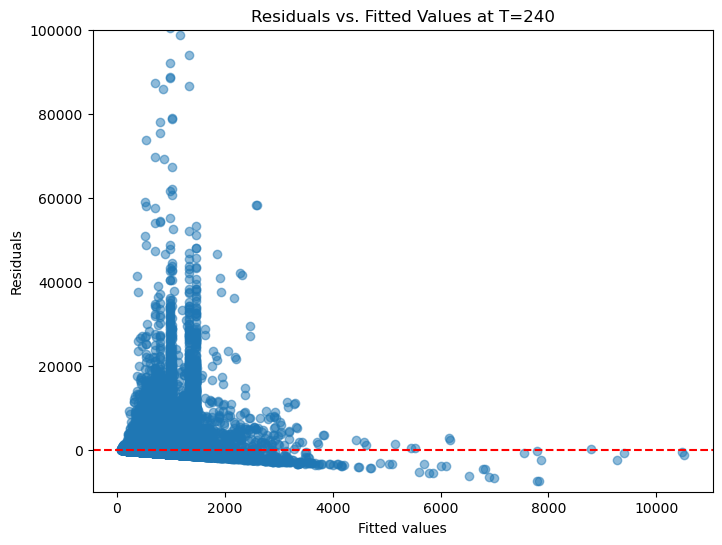

In [1104]:

for t in [0, 30, 120, 240]:
    plot_residuals_vs_fitted(df_main_kmers[df_main_kmers[f'time_{t}']==1]['count'],
                             big_model_prediction[f'genotype|time_{t}']['y_pred'])
    plt.ylim(-10000, 100000)
    plt.title(f'Residuals vs. Fitted Values at T={t}')
    plt.savefig(f'plot_fin_model_resid_{t}.png', bbox_inches="tight")
    
    plt.show()

# End